# ICON-CNRM (SSP) Lifecycle Analysis (2070-2099)

# Import packages

In [1]:
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.path as mpath
import matplotlib.cm as cm
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
import cartopy.feature
from matplotlib.patches import Rectangle
from matplotlib.patches import Circle
import numpy as np
import pandas as pd
import scipy
import datetime
import cartopy
from metpy.units import units
import cartopy.crs as ccrs
import pickle
import os
import glob
import subprocess
import dask
from joblib import Parallel, delayed
from geopy.distance import distance  
import cmocean as cmo
  
from mpl_toolkits.axes_grid1.inset_locator import inset_axes


import concurrent.futures

### Load MOAAP functions
import sys
sys.path.append('/work/aa0049/a271122/MOAAP/MOAAP/')
from src.utils import *
from src.Corrections import * 
from src.Enumerations import Month, Season, Experiments, Domains
from src.xarray_util import create_obj_from_dict,  ObjectContainer,  load_tracking_objects
from src.plot_funcs import plot_contourf_rotated_grid #, plot_unstructured_rotated_grid

from src.GridPoints import Domain

/work/aa0049/a271122/MOAAP/MOAAP/src/xarray_util.py:28: AccessorRegistrationWarning: registration of accessor <class 'src.xarray_util.Accessor'> under name 'get' for type <class 'xarray.core.dataset.Dataset'> is overriding a preexisting attribute with the same name.
  class Accessor:


In [2]:
### Load my functions
from ICON_utils import *

In [3]:
dask.config.set(**{'array.slicing.split_large_chunks': True})

In [4]:
ICON_CNRM_path = '/work/aa0049/a271041/CMOR/CORDEX-CMIP6/DD/ARC-12/CLMcom-AWI/CNRM-ESM2-1/ssp370/r1i1p1f2/ICON-CLM-2-6-6-1-1/v1-r1/1hr/'

In [5]:
ICON_clim_path = '/work/aa0049/a271122/ICON_CNRM/ssp/'

# Load Objects

In [6]:
ds=xr.open_dataset('/work/aa0049/a271041/spice-v2.1/chain/work/run_era5_polarres_wp3_hindcast2/post/yearly/T_2M/T_2M_2020010100-2020123123.ncz')

# extract the rotated coordinate system
crs_rot = ccrs.RotatedPole(pole_longitude=ds.rotated_pole.attrs['grid_north_pole_longitude'],\
                           pole_latitude=ds.rotated_pole.attrs['grid_north_pole_latitude'])

In [7]:

#Land/lake mask
ds_land = xr.open_dataset('/work/aa0049/a271109/spice-v2.2/chain/work/polarres_wp3_cmip_CNRM_ssp370/post/yearly/FR_LAND/FR_LAND.ncz')
ds_lake = xr.open_dataset('/work/aa0049/a271109/spice-v2.2/chain/work/polarres_wp3_cmip_CNRM_ssp370/post/yearly/FR_LAKE/FR_LAKE.ncz')

# Define custom sectors for selection

In [8]:
from enum import Enum

class Domains(Enum):
    NORTH_ATLANTIC = Domain(north=70, south=50, east=0, west=-60)
    NORTH_PACIFIC = Domain(north=70, south=40, east=-140, west=160)
    CENTRAL_ARCTIC = Domain(north=90, south=70, east=180, west=-180)
    FRAM_STRAIT = Domain(north=81, south=77, east=10, west=-10)
    GREENLAND_SEA = Domain(north=80, south=75, east=10, west=-20)
    BERING_STRAIT = Domain(north=70, south=65, east=-150, west=160)
    BAFFIN_BAY = Domain(north=75, south=65, east=-55, west=-80)
    ARCTIC_ENTRANCE_NA = Domain(north=72, south=69, east=20, west=-25)
    NORTH_AMERICA = Domain(north=70, south=60, east=-80, west=-140)
    SIBERIA = Domain(north=70, south=60, east=135, west=75)

    # JLa custom domains
    NORTH_ATLANTIC_JLa = Domain(north=80, south=67, east=60, west=-30)
    BEAUFORT_SIBERIAN_JLa = Domain(north=80, south=70, east=-120, west=120)
    CENTRAL_ARCTIC_JLa = Domain(north=90, south=80, east=180, west=-180)



# Define new domain values
NORTH_ATLANTIC_JLa = Domain(north=80, south=67, east=60, west=-30)
BEAUFORT_SIBERIAN_JLa = Domain(north=80, south=70, east=120, west=-120)
CENTRAL_ARCTIC_JLa = Domain(north=90, south=80, east=180, west=-180)


gridspacing=0.75
lat=np.arange(-90, 90+gridspacing,gridspacing)
lon=np.arange(-180, 180+gridspacing,gridspacing)
ds_dummy = xr.Dataset({"dummy": (("lat", "lon"), np.ones([len(lat), len(lon)]))},coords={"lon": lon,"lat": lat})


dd=ds_dummy.copy()
mask_domain_CentralArctic=dd.dummy.where(dd.lat>80).notnull()
mask_domain_NorthAtlantic=dd.dummy.where((dd.lat<=80) & (dd.lat>67) & (dd.lon>-30) & (dd.lon<60)).notnull()
mask_domain_BeaufortSiberianSea1=dd.dummy.where((dd.lat<=80) & (dd.lat>70) & (dd.lon>120)).notnull()
mask_domain_BeaufortSiberianSea2=dd.dummy.where((dd.lat<=80) & (dd.lat>70) & (dd.lon<-120)).notnull()

mask_domain_BeaufortSiberianSea = mask_domain_BeaufortSiberianSea1 | mask_domain_BeaufortSiberianSea2

mask_domains = {
    "CentralArctic": {"mask": mask_domain_CentralArctic, "color": 'darkred',"north":90,"south":80,"east":180,"west":-180},
    "NorthAtlantic": {"mask": mask_domain_NorthAtlantic, "color": 'darkblue',"north":80,"south":67,"east":60,"west":-30},
    "BeaufortSiberianSea": {"mask": mask_domain_BeaufortSiberianSea, "color": "gold","north":80,"south":70,"east":120,"west":-120},
}
domains = ["NorthAtlantic","CentralArctic","BeaufortSiberianSea"]

#### Objects 1984-2014

In [11]:
with open('/work/aa0049/a271122/scripts/ICON_CNRM/Object_container_1984-2014.pkl', 'rb') as f:
   objs_his = pickle.load(f) 


In [12]:
objs_sel_his, ids_sel = sel_objs(objs_his,season='DJF')

In [13]:
objs_sel_tc = extract_and_transform_rot_coords(objs_sel_his)
objs_final_his = create_final_objs(objs_sel_tc)
#Select all dates in which an event appeared 
objs_times_his=[ds.times for ds in objs_final_his]

#Combine all dates in a data array 
objs_all_times_his = xr.concat(objs_times_his, dim='times').sortby('times').drop_duplicates(dim='times')


8


In [14]:
objs_all_times_his

<xarray.DataArray 'times' (times: 810)>
array(['1992-01-19T12:00:00.000000000', '1992-01-19T13:00:00.000000000',
       '1992-01-19T14:00:00.000000000', ..., '2011-12-11T01:00:00.000000000',
       '2011-12-11T02:00:00.000000000', '2011-12-11T03:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * times    (times) datetime64[ns] 1992-01-19T12:00:00 ... 2011-12-11T03:00:00

In [52]:
df_objs_his=define_df_objs(objs_final_his)
df_objs_his

,id,color
0,80566,"(0.2235294117647059, 0.23137254901960785, 0.47..."
1,80577,"(0.4196078431372549, 0.43137254901960786, 0.81..."
2,175473,"(0.5490196078431373, 0.6352941176470588, 0.321..."
3,190626,"(0.807843137254902, 0.8588235294117647, 0.6117..."
4,190631,"(0.9058823529411765, 0.7294117647058823, 0.321..."
5,196823,"(0.5176470588235295, 0.23529411764705882, 0.22..."
6,210541,"(0.9058823529411765, 0.5882352941176471, 0.611..."
7,276647,"(0.6470588235294118, 0.3176470588235294, 0.580..."


#### Objects 2015-2099

In [ ]:
exp_ICON_CNRM_SSP=Experiments.ICON_CNRM_SSP.value
input_path_ICON_CNRM_SSP= exp_ICON_CNRM_SSP.IVTobj_out_path
type_='IVT'
input_file_name_temp_ICON_CNRM_SSP = 'MOAPP_ICON_100and85CNRMsspperc_remapped_3x'
first_year = 2015
last_year = 2099
num_years = last_year-first_year

objs = load_tracking_objects(input_path_ICON_CNRM_SSP,
                                      input_file_name_temp_ICON_CNRM_SSP,
                                      type_, first_year,
                                      last_year,
                                      load_coordinates=True,
                                      load_clusters=True,
                                      exp=exp_ICON_CNRM_SSP,                                                                
                                      )

In [ ]:
with open('/work/aa0238/a271093/results/MOAAP/IVT_Tracking/CNRM_ssp_remapped_3x/Object_container_2015-2099_withClusters.pkl', 'rb') as f:
   objs = pickle.load(f) 

In [ ]:
#select objects that cross the North Atlantic, central Arctic and Beaufort region -> here, there could be an extension where the order is important #,select_last_timesteps=True
def sel_objs(objs,season):

    # how is domain_frac defined?
    objs_sel = objs.sel_season(Season[season]) \
                                .sel_by_domain(Domains.NORTH_ATLANTIC_JLa.value,type_="anytime",domain_frac=0.,select_last_timesteps = True) \
                                .sel_by_domain(Domains.CENTRAL_ARCTIC_JLa.value,type_="anytime", domain_frac=0.,select_last_timesteps = True)  \
                                .sel_by_domain(Domains.BEAUFORT_SIBERIAN_JLa.value,type_="anytime", domain_frac=0.,select_last_timesteps= True)

    
    ids_sel=[ds.id_.item() for ds in objs_sel]

    return objs_sel, ids_sel

In [ ]:
objs_sel, ids_sel = sel_objs(objs,season='DJF')

In [ ]:
#objs_sel= objs_sel[27:]

In [ ]:
#objs_sel[0]

In [ ]:
#DJF 
objs_sel_tc = extract_and_transform_rot_coords(objs_sel)

In [ ]:
#DJF
objs_final = create_final_objs(objs_sel_tc)

#### Objects 2070-2099

In [9]:
with open('/work/aa0049/a271122/MOAAP/IVT_Tracking/CNRM_ssp_remapped_3x/Object_container_2070-2099_withClusters_filtered.pkl', 'rb') as f:
    objs_final = pickle.load(f)

In [10]:
df_objs=define_df_objs(objs_final)
df_objs

,id,color
0,556662,"(0.2235294117647059, 0.23137254901960785, 0.47..."
1,560541,"(0.2235294117647059, 0.23137254901960785, 0.47..."
2,560604,"(0.3215686274509804, 0.32941176470588235, 0.63..."
3,560684,"(0.4196078431372549, 0.43137254901960786, 0.81..."
4,560721,"(0.611764705882353, 0.6196078431372549, 0.8705..."
5,565445,"(0.38823529411764707, 0.4745098039215686, 0.22..."
6,616730,"(0.38823529411764707, 0.4745098039215686, 0.22..."
7,686981,"(0.5490196078431373, 0.6352941176470588, 0.321..."
8,695456,"(0.7098039215686275, 0.8117647058823529, 0.419..."
9,696737,"(0.807843137254902, 0.8588235294117647, 0.6117..."


In [11]:
#Select all dates in which an event appeared 
objs_times=[ds.times for ds in objs_final]

#Combine all dates in a data array 
objs_all_times = xr.concat(objs_times, dim='times').sortby('times').drop_duplicates(dim='times')


Text(0.0, 1.0, '2070-2099')

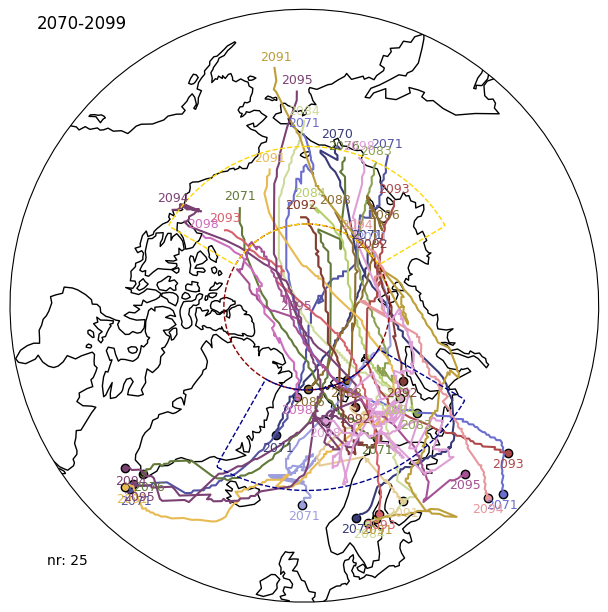

In [18]:
fig,ax=plt.subplots(1,1,subplot_kw={'projection': ccrs.Orthographic(0,90)},figsize=(7,7)) #    

objs_nr=len(objs_final)

for i in range(objs_nr):
    track=objs_final[i].track.values
    
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track])  

    if isinstance(df_objs, pd.DataFrame):
        obj_id=objs_final[i]['id_'].item()
        obj_color=df_objs[df_objs['id'] == obj_id].color.item()
        ax.text(track_lons[-1]+2,track_lats[-1]-1.1,str(pd.to_datetime(objs_final[i].times[0].values).strftime('%Y')),fontsize=9,
            transform=crs_rot,color=obj_color,zorder=12) #color=obj_color
        
        ax.text(track_lons[0]+2,track_lats[0]+2,str(pd.to_datetime(objs_final[i].times[0].values).strftime('%Y')),fontsize=9,
        transform=crs_rot,color=obj_color,zorder=12)
        ax.scatter(track_lons[0],track_lats[0],facecolor=obj_color,edgecolor='k',transform=crs_rot)
        ax.plot(track_lons,track_lats,color=obj_color,transform=crs_rot) 

ax.coastlines()
ax.set_extent([-180, 180, 55, 90], crs=ccrs.PlateCarree())
#ax.gridlines(linewidth=0.5, color='dimgray', alpha=0.4, zorder=2)

center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)),
                               np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

for domain_name, domain_data in mask_domains.items():
    domain_data["mask"].plot.contour(levels=1,colors=domain_data["color"],linewidths=1,linestyles='--',zorder=4,ax=ax,transform=ccrs.PlateCarree())

ax.text(0.02,0.02,f'nr: {objs_nr}',transform=ax.transAxes,\
       bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

ax.set_title('2070-2099',loc='left')

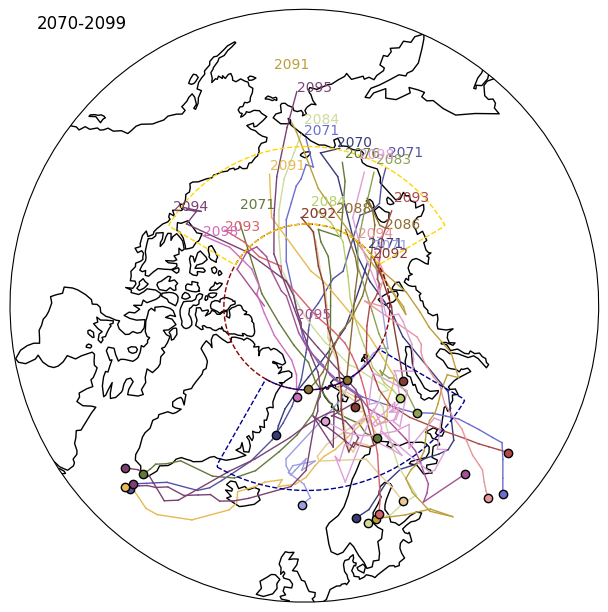

In [19]:
fig,ax=plt.subplots(1,1,subplot_kw={'projection': ccrs.Orthographic(0,90)},figsize=(7,7)) #    

objs_nr=len(objs_final)

for i in range(objs_nr):
    track = objs_final[i].track.values
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track])  

    if isinstance(df_objs, pd.DataFrame):
        obj_id = objs_final[i]['id_'].item()
        obj_color = df_objs[df_objs['id'] == obj_id].color.item()
        
        # Only once per object
        ax.text(track_lons[-1], track_lats[-1],
                str(pd.to_datetime(objs_final[i].times[0].values).strftime('%Y')),
                fontsize=10, transform=crs_rot, color=obj_color, zorder=12)

        ax.scatter(track_lons[0], track_lats[0],
                   facecolor=obj_color, edgecolor='k',
                   transform=crs_rot, zorder=12)

        # Now draw the lines
        for j in range(0, len(track_lats) - 6, 6):
            lat_start = track_lats[j]
            lon_start = track_lons[j]
            lat_end = track_lats[j + 6]
            lon_end = track_lons[j + 6]
            ax.plot([lon_start, lon_end], [lat_start, lat_end],
                    color=obj_color, transform=crs_rot, linewidth=1)
ax.coastlines()
ax.set_extent([-180, 180, 55, 90], crs=ccrs.PlateCarree())
#ax.gridlines(linewidth=0.5, color='dimgray', alpha=0.4, zorder=2)

center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)),
                               np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

for domain_name, domain_data in mask_domains.items():
    domain_data["mask"].plot.contour(levels=1,colors=domain_data["color"],linewidths=1,linestyles='--',zorder=4,ax=ax,transform=ccrs.PlateCarree())


ax.set_title('2070-2099',loc='left')
plt.savefig('/work/aa0049/a271122/ICON_CNRM/tracks_eoc.png',dpi=300)

plt.show()


In [11]:
for i in range(len(objs_final)):
    track=objs_final[i].track.values
    
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track]) 
    print(str(objs_final[i]['times'][0].values.astype('datetime64[h]')))

2070-12-13T23
2071-01-06T14
2071-01-23T06
2071-02-09T03
2071-02-20T10
2071-12-20T09
2076-12-15T14
2083-12-14T21
2084-12-03T03
2084-12-05T03
2086-01-02T23
2088-02-16T22
2091-01-22T09
2091-02-01T12
2091-12-27T10
2092-01-01T01
2092-01-19T03
2093-02-09T15
2093-02-14T12
2094-02-28T00
2094-12-23T05
2095-02-04T08
2095-12-01T00
2098-01-02T17
2098-02-14T16


In [12]:
objs_times=[ds.times for ds in objs_final]

#Combine all dates in a data array 
objs_all_times = xr.concat(objs_times, dim='times').sortby('times').drop_duplicates(dim='times')

#Select all dates in which objects are in specific domains 
NA_combined_times, CA_combined_times, BS_combined_times = combine_times(objs_final)

In [13]:
objs_all_times

<xarray.DataArray 'times' (times: 3189)>
array(['2070-12-13T23:00:00.000000000', '2070-12-14T00:00:00.000000000',
       '2070-12-14T01:00:00.000000000', ..., '2098-03-03T19:00:00.000000000',
       '2098-03-03T20:00:00.000000000', '2098-03-03T21:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * times    (times) datetime64[ns] 2070-12-13T23:00:00 ... 2098-03-03T21:00:00

# Plot Lifecycle Composites

### Functions

##### "Global variables"

In [23]:
#Sea level pressure
var='psl'
varname = 'psl'
ds = xr.open_mfdataset(f'{ICON_CNRM_path}/{var}/v20250601/{var}_*.nc',chunks = {'time':10})
ds_clim = xr.open_dataset(f'{ICON_clim_path}clim/{var}/{var}_clim_day_DJF_ssp_70-99.nc',chunks={'time': 10})

#Select dataset and climatology for different domain times
var_NA, var_CA, var_BS, var_clim_NA, var_clim_CA, var_clim_BS = get_domain_values(ds[varname],ds_clim,
                                                                                  NA_combined_times, CA_combined_times, BS_combined_times)

#Compute anomalies
psl_NA_anom = var_NA - var_clim_NA[varname].mean(dim='time')
psl_CA_anom = var_CA - var_clim_CA[varname].mean(dim='time')
psl_BS_anom = var_BS - var_clim_BS[varname].mean(dim='time')


In [21]:
#Sea Ice edge
ds_ice_his = xr.open_mfdataset('/work/aa0049/a271041/CMOR/CORDEX-CMIP6/DD/ARC-12/CLMcom-AWI/CNRM-ESM2-1/historical/r1i1p1f2/ICON-CLM-2-6-6-1-1/v1-r1/mon/siconca/v20250601/siconca_*.nc',chunks = {'time':10})
siconc_mean_his = ds_ice_his.siconca.sel(time=ds_ice_his.siconca.time.dt.month.isin([12, 1, 2])).mean(dim='time') #Winter sea ice

sea_ice_edge_his = siconc_mean_his.where(((ds_land.FR_LAND+ds_lake.FR_LAKE)<0.85))


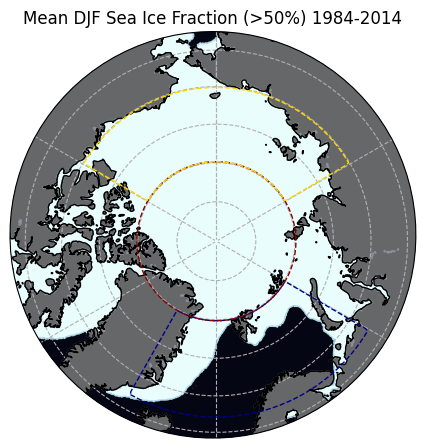

In [27]:


# Define custom colormap (midnight blue for <1, white for 1)
#colors = ["midnightblue", "snow"]  # Define colors
#bounds = [0, 0.9999, 1]  # Boundaries for color mapping
#cmap = mcolors.ListedColormap(colors)  # Create colormap
#norm = mcolors.BoundaryNorm(bounds, cmap.N)  # Ensure correct mapping

cmap='cmo.ice'
fig, ax = plt.subplots(1,1,subplot_kw={'projection': ccrs.Orthographic(0,90)})#,figsize=(16,4))

variable =  (sea_ice_edge_his>50).plot(ax=ax,transform=crs_rot,cmap=cmap,vmin=0,vmax=1, add_colorbar = False)
   
# Add custom colorbar
#colorbar = plt.colorbar(variable, ax=ax, orientation='vertical', pad=0.06, shrink=0.8)
#colorbar.set_label('', fontsize=10)
#colorbar.ax.tick_params(labelsize=10)


#Add sea ice
contour = (sea_ice_edge_his>50).plot.contour(levels=1, ax = ax, transform = crs_rot, colors = 'lightblue', linewidths = 1, linestyles = '-',zorder=1)

#Add domain mask
for domain in domains: 
    mask_domains[domain]["mask"].plot.contour(levels=1,colors=mask_domains[domain]["color"],\
        linewidths=1,linestyles='--',zorder=4,ax=ax,transform=ccrs.PlateCarree())
ax.set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
ax.gridlines(linestyle='--',zorder=3)
ax.coastlines(zorder=2)
ax.add_feature(cartopy.feature.LAND, color='gray',alpha=0.8,zorder=1, edgecolor='black') 
ax.add_feature(cartopy.feature.OCEAN, color='midnightblue',zorder=0, edgecolor='None')

ax.set_aspect('equal')
center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)), np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
ax.set_title("Mean DJF Sea Ice Fraction (>50%) 1984-2014",y=1.05)

plt.savefig('sic_84-14_CNRM.png')
plt.show()

In [14]:

#Sea Ice edge
ds_ice = xr.open_mfdataset('/work/aa0049/a271041/CMOR/CORDEX-CMIP6/DD/ARC-12/CLMcom-AWI/CNRM-ESM2-1/ssp370/r1i1p1f2/ICON-CLM-2-6-6-1-1/v1-r1/mon/siconca/v20250601/siconca_*.nc',chunks = {'time':10})
ds_ice = ds_ice.sel(time=slice("2070-01-15", "2099-12-16"))
siconc_mean = ds_ice.siconca.sel(time=ds_ice.siconca.time.dt.month.isin([12, 1, 2])).mean(dim='time') #Winter sea ice

sea_ice_edge = siconc_mean.where(((ds_land.FR_LAND+ds_lake.FR_LAKE)<0.85))

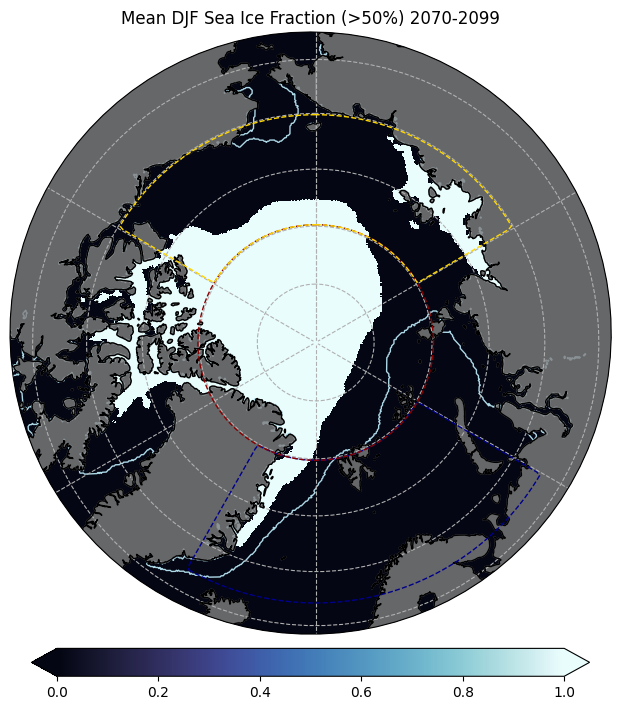

In [31]:
# Define custom colormap (midnight blue for <1, white for 1)
#colors = ["midnightblue", "snow"]  # Define colors
#bounds = [0, 0.9999, 1]  # Boundaries for color mapping
#cmap = mcolors.ListedColormap(colors)  # Create colormap
#norm = mcolors.BoundaryNorm(bounds, cmap.N)  # Ensure correct mapping

cmap='cmo.ice'
fig, ax = plt.subplots(1,1,subplot_kw={'projection': ccrs.Orthographic(0,90)},figsize=(9,9))

variable =  (sea_ice_edge>85).plot(ax=ax,transform=crs_rot,cmap=cmap,vmin=0,vmax=1, add_colorbar = False)
   
# Add custom colorbar
colorbar = plt.colorbar(variable, ax=ax, orientation='horizontal', pad=0.06, shrink=0.8,extend='both')
colorbar.set_label('', fontsize=10)
colorbar.ax.tick_params(labelsize=10)


#Add sea ice
contour = (sea_ice_edge>50).plot.contour(levels=1, ax = ax, transform = crs_rot, colors = 'lightblue', linewidths = 1, linestyles = '-',zorder=1)

#Add domain mask
for domain in domains: 
    mask_domains[domain]["mask"].plot.contour(levels=1,colors=mask_domains[domain]["color"],\
        linewidths=1,linestyles='--',zorder=4,ax=ax,transform=ccrs.PlateCarree())
ax.set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
ax.gridlines(linestyle='--',zorder=3)
ax.coastlines(zorder=2)
ax.add_feature(cartopy.feature.LAND, color='gray',alpha=0.8,zorder=1, edgecolor='black') 
ax.add_feature(cartopy.feature.OCEAN, color='midnightblue',zorder=0, edgecolor='None')

ax.set_aspect('equal')
center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)), np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
ax.set_title("Mean DJF Sea Ice Fraction (>50%) 2070-2099",y=1.05)

plt.savefig('sic_70-99_CNRM.png')
plt.show()

In [32]:
sic_change = siconc_mean - siconc_mean_his
sea_ice_edge_change = sic_change.where(((ds_land.FR_LAND+ds_lake.FR_LAKE)<0.85))

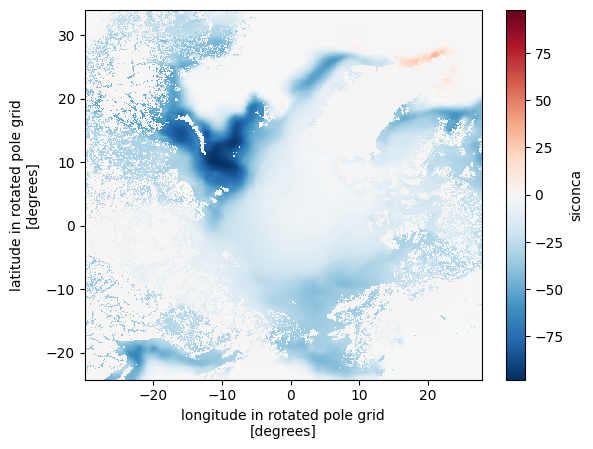

In [33]:
sic_change.plot()

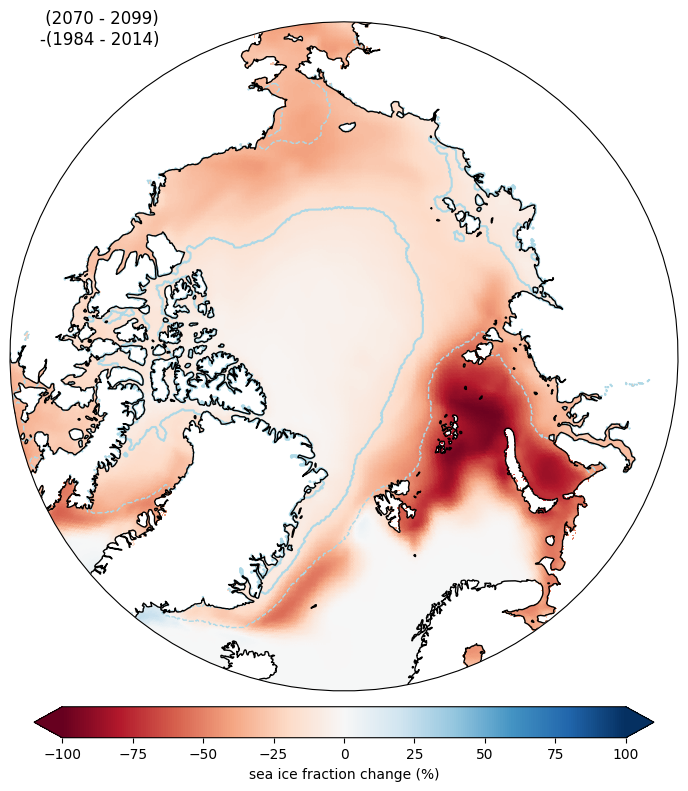

In [34]:
# Define custom colormap (midnight blue for <1, white for 1)
#colors = ["midnightblue", "snow"]  # Define colors
#bounds = [0, 0.9999, 1]  # Boundaries for color mapping
#cmap = mcolors.ListedColormap(colors)  # Create colormap
#norm = mcolors.BoundaryNorm(bounds, cmap.N)  # Ensure correct mapping

cmap='RdBu'
fig, ax = plt.subplots(1,1,subplot_kw={'projection': ccrs.Orthographic(0,90)},figsize=(10,10))

variable =  sea_ice_edge_change.plot(ax=ax,transform=crs_rot,cmap=cmap,vmin=-100,vmax=100,add_colorbar=False)
   
# Add custom colorbar
colorbar = plt.colorbar(variable, ax=ax, orientation='horizontal', pad=0.06, shrink=0.8,extend='both')
colorbar.set_label('sea ice fraction change (%)', fontsize=10)
colorbar.ax.tick_params(labelsize=10)


#Add sea ice
contour = (sea_ice_edge>50).plot.contour(levels=1, ax = ax, transform = crs_rot, colors = 'lightblue', linewidths = 1, linestyles = '--',zorder=1)
contour = (sea_ice_edge>85).plot.contour(levels=1, ax = ax, transform = crs_rot, colors = 'lightblue', linewidths = 1.5, linestyles = '-',zorder=1)

#Add domain mask
#for domain in domains: 
#    mask_domains[domain]["mask"].plot.contour(levels=1,colors=mask_domains[domain]["color"],\
#        linewidths=1,linestyles='--',zorder=4,ax=ax,transform=ccrs.PlateCarree())

ax.set_aspect('equal')
center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)), np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

ax.set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
#ax.gridlines(linestyle='--',zorder=3)
ax.coastlines(zorder=2)

ax.set_title(" (2070 - 2099) \n-(1984 - 2014)",loc='left')

plt.savefig('/work/aa0049/a271122/ICON_CNRM/sic_change_CNRM.png')
plt.show()



#### tas (T_2M)

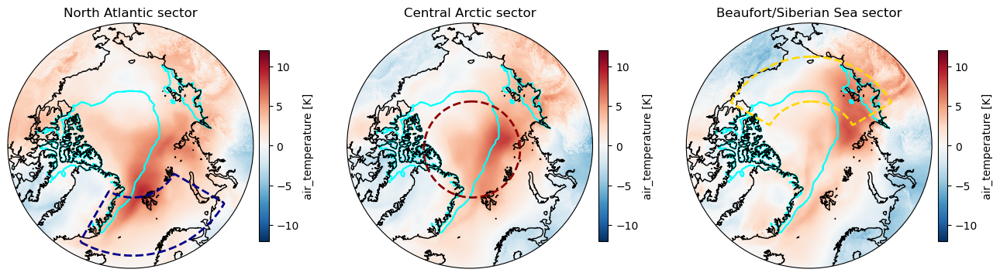

In [20]:
create_composites('tas','tas',NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_CNRM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -12,12,ssp=True,period='70-99',
                  startdate="2070-01-01", enddate="2099-12-31")

#### pr (PREC_CON)

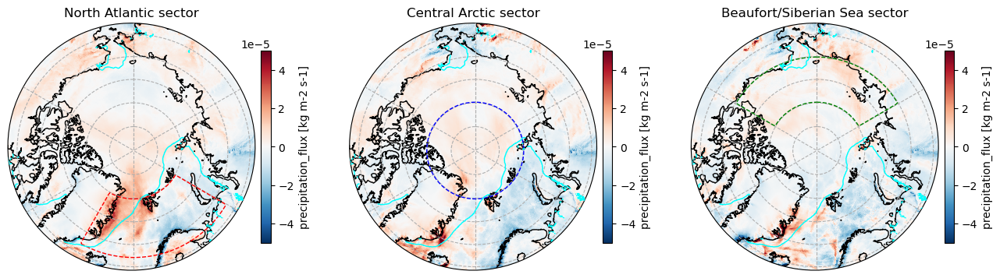

In [120]:
create_composites('pr','pr',NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_CNRM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -0.00005,0.00005,ssp=True,period='70-99',
                  startdate="2070-01-01", enddate="2099-12-31")

#### rlds (ATHD_S)

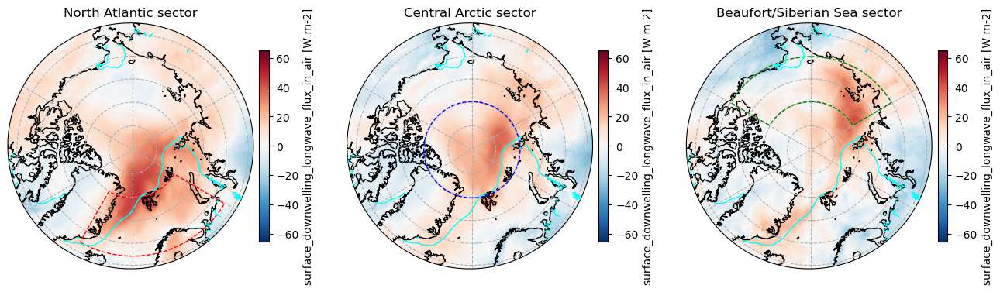

In [121]:
create_composites('rlds','rlds',NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_CNRM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -65,65,ssp=True,period='70-99',
                  startdate="2070-01-01", enddate="2099-12-31")

#### hfls (ALHFL_S)

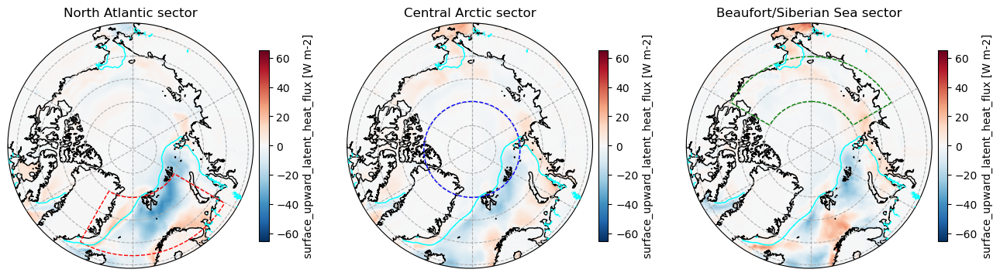

In [122]:
create_composites('hfls','hfls',NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_CNRM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -65,65,ssp=True,period='70-99',
                  startdate="2070-01-01", enddate="2099-12-31")

#### hfss (ASHFL_S)

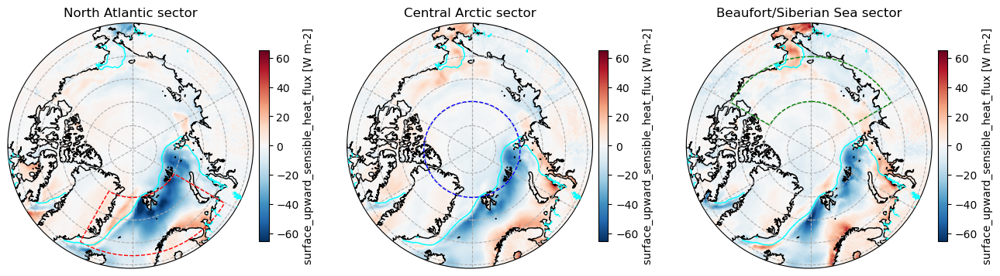

In [123]:
create_composites('hfss','hfss',NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_CNRM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -65,65,ssp=True,period='70-99',
                  startdate="2070-01-01", enddate="2099-12-31")

#### psl (PMSL)

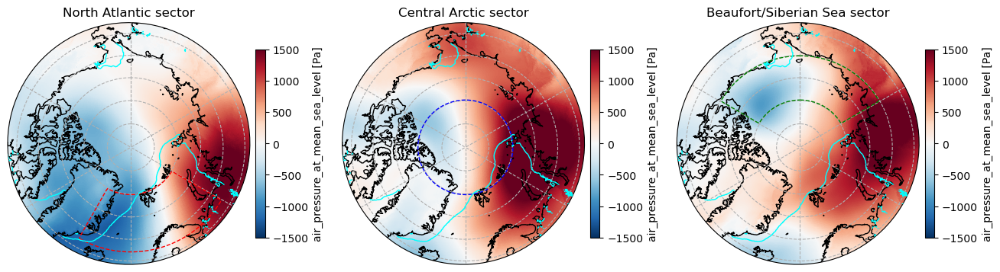

In [124]:
create_composites('psl','psl',NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_CNRM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -1500,1500,ssp=True,period='70-99',
                  startdate="2070-01-01", enddate="2099-12-31")

#### hurs (RELHUM_2M)

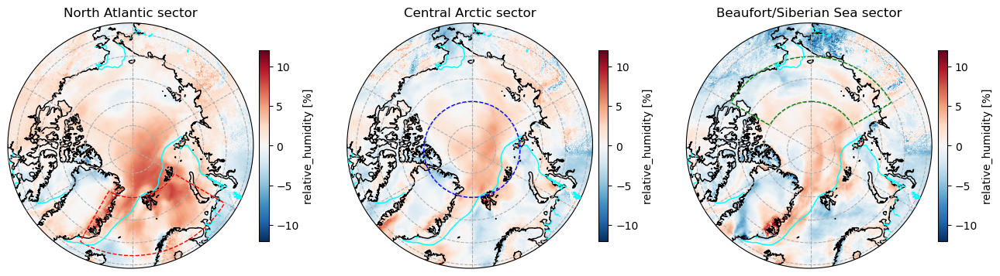

In [125]:
create_composites('hurs','hurs',NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_CNRM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -12,12,ssp=True,period='70-99',
                  startdate="2070-01-01", enddate="2099-12-31")

#### prw (TQV)

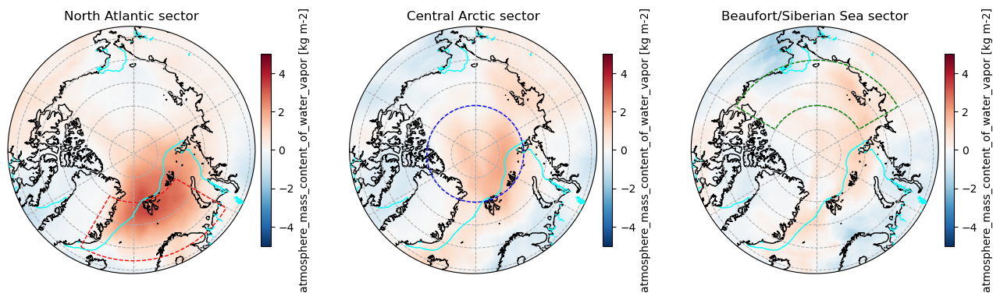

In [126]:
create_composites('prw','prw',NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_CNRM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -5,5,ssp=True,period='70-99',
                  startdate="2070-01-01", enddate="2099-12-31")

#### sfcWind

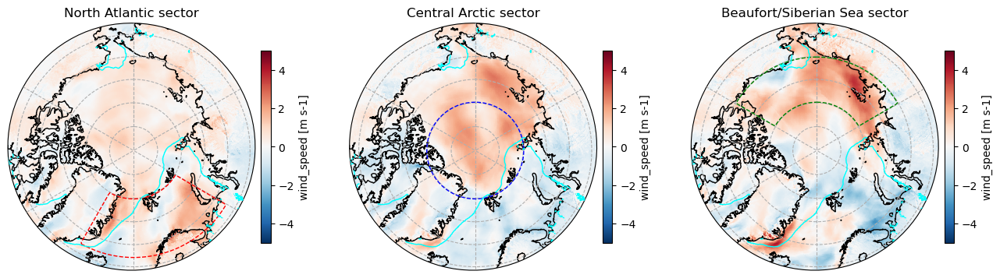

In [127]:
create_composites('sfcWind','sfcWind',NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_CNRM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -5,5,ssp=True,period='70-99',
                  startdate="2070-01-01", enddate="2099-12-31")

#### clivi

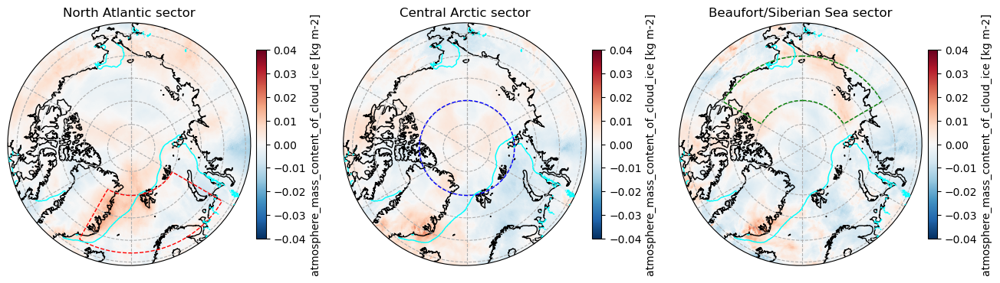

In [128]:
create_composites('clivi','clivi',NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_CNRM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -0.04,0.04,ssp=True,period='70-99',
                  startdate="2070-01-01", enddate="2099-12-31")

#### clwvi

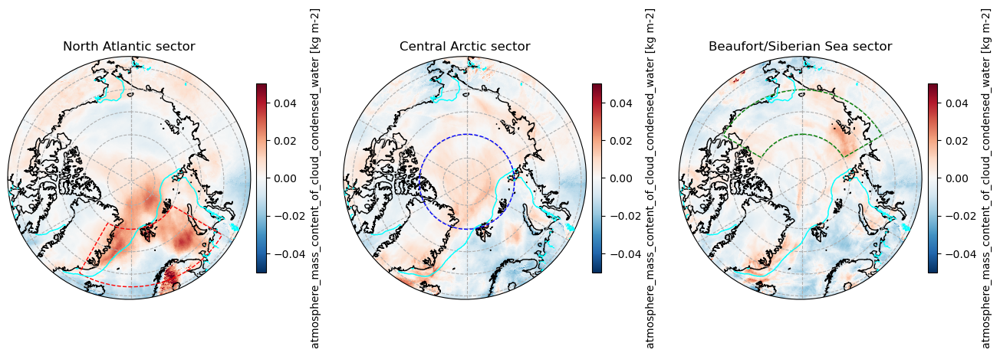

In [129]:
create_composites('clwvi','clwvi',NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_CNRM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -0.05,0.05,ssp=True,period='70-99',
                  startdate="2070-01-01", enddate="2099-12-31")

### Lifecycle MOAAP Objects

#### Functions

In [15]:
#Open moaap objects 
ds_moaap = xr.open_mfdataset('/work/aa0238/a271093/results/MOAAP/IVT_Tracking/CNRM_ssp_remapped_3x/ObjectMasks_MOAPP_ICON_100and85CNRMsspperc_remapped_3x_*_corrected.nc',chunks={'time': 10})


# Extract 2D latitude and longitude values
lat_tmp=ds_moaap.rlat.isel(x=0).values[0] #time=0,
lon_tmp=ds_moaap.rlon.isel(y=0).values[0] #time=0,

# Drop original variables and assign lat/lon as coordinates
ds_moaap=ds_moaap.drop(['rlat','rlon']).rename_dims({'y':'rlat','x':'rlon'}).assign_coords(rlat=lat_tmp,rlon=lon_tmp)

In [16]:
ds_moaap_DJF = ds_moaap.where(ds_moaap['time'].dt.month.isin([12, 1, 2]), drop=True)

In [28]:

# Make sure flat_times is a NumPy datetime64 array
all_times_np = np.array(objs_all_times, dtype='datetime64[ns]')

# Select only matching times
ds_moaap_DJF_filtered = ds_moaap_DJF.sel(time=ds_moaap_DJF.time[np.isin(ds_moaap_DJF.time.values, all_times_np)])


In [38]:
list_ids = [objs_final[i]['id_'].item() for i in range(len(objs_final))]
list_ids_int = np.array(list_ids, dtype=int)

In [39]:
np.unique(ds_moaap_DJF_filtered.IVT_Objects.isel(rlon=100,rlat=100).values)

array([     0., 560684., 566699., 616730., 696737., 760610., 766951.,
       770497., 770498., 780805., 780821., 795491., 796917., 806941.],
      dtype=float32)

In [40]:
ivt_objects = ds_moaap_DJF_filtered.IVT_Objects.values.astype(int)  # convert to int
mask = np.isin(ivt_objects, list_ids_int)  # True where IVT_Object is in list_ids_int


In [41]:

TA_WAIs_SSP = mask.sum(axis=0)  # shape: [lat, lon]


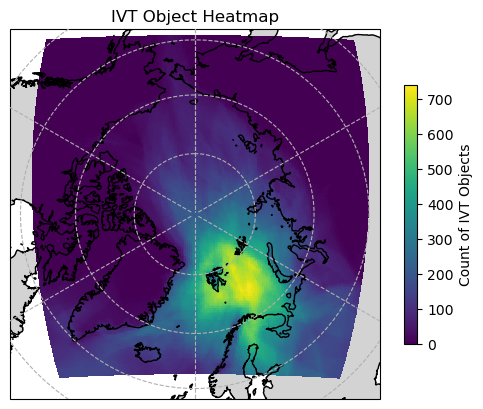

In [25]:


fig, ax = plt.subplots(1, 1,subplot_kw={'projection': ccrs.Orthographic(0,90)})

lats = ds_moaap_DJF_filtered.rlat
lons = ds_moaap_DJF_filtered.rlon

count = ax.pcolormesh(lons, lats, TA_WAIs_SSP, cmap='viridis',transform=crs_rot)#,cbar_kwargs={'extend':'neither','pad':0.01})

# Add the colorbar
cbar = fig.colorbar(count, ax=ax, orientation='vertical', shrink=0.7, pad=0.05)
cbar.set_label('Count of IVT Objects')


ax.set_extent([-180, 180, 58, 90], crs=ccrs.PlateCarree())
ax.set_title('IVT Object Heatmap')
ax.gridlines(linestyle='--',zorder=3)
ax.coastlines(zorder=2)
ax.add_feature(cartopy.feature.LAND, color='lightgray',zorder=0, edgecolor='None') 
plt.show()

In [77]:
ivt_objects = ds_moaap_DJF_filtered.IVT_Objects.values  # shape: (time, lat, lon)

# Mask out all objects not in list_ids_int
mask = np.isin(ivt_objects, list_ids_int)

# Apply mask: set other values to 0
ivt_masked = np.where(mask, ivt_objects, 0)

# For each grid cell, find the number of unique objects (ignoring 0)
TA_WAIs_SSP = np.apply_along_axis(lambda x: len(np.unique(x[x != 0])), axis=0, arr=ivt_masked)


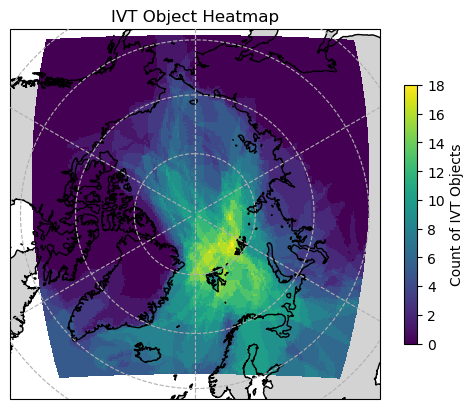

In [90]:


fig, ax = plt.subplots(1, 1,subplot_kw={'projection': ccrs.Orthographic(0,90)})

lats = ds_moaap_DJF_filtered.rlat
lons = ds_moaap_DJF_filtered.rlon

count = ax.pcolormesh(lons, lats, TA_WAIs_SSP, cmap='viridis',transform=crs_rot,vmin=0,vmax=18)#,cbar_kwargs={'extend':'neither','pad':0.01})

# Add the colorbar
cbar = fig.colorbar(count, ax=ax, orientation='vertical', shrink=0.7, pad=0.05)
cbar.set_label('Count of IVT Objects')


ax.set_extent([-180, 180, 58, 90], crs=ccrs.PlateCarree())
ax.set_title('IVT Object Heatmap')
ax.gridlines(linestyle='--',zorder=3)
ax.coastlines(zorder=2)
ax.add_feature(cartopy.feature.LAND, color='lightgray',zorder=0, edgecolor='None') 
plt.show()

##### Historical

In [42]:
#Open moaap objects 
ds_moaap_his = xr.open_mfdataset('/work/aa0238/a271093/results/MOAAP/IVT_Tracking/CNRM_control_remapped_3x_new/ObjectMasks_MOAPP_ICON_100and85controlperc_remapped_3x_*_corrected.nc',chunks={'time': 10})

# Extract 2D latitude and longitude values
lat_tmp = ds_moaap_his.rlat.isel(time=0,x=0).values  # 2D latitude array
lon_tmp = ds_moaap_his.rlon.isel(time=0,y=0).values  # 2D longitude array

# Drop original variables and assign lat/lon as coordinates
ds_moaap_his = ds_moaap_his.drop(['rlat', 'rlon']) \
                   .rename_dims({'y': 'rlat', 'x': 'rlon'}) \
                   .assign_coords(rlat=('rlat', lat_tmp), 
                                  rlon=('rlon', lon_tmp))

#ds_moaap = ds_moaap.isel(yc=0, xc=0).squeeze()

In [43]:
ds_moaap_DJF_his = ds_moaap_his.where(ds_moaap_his['time'].dt.month.isin([12, 1, 2]), drop=True)

In [44]:

# Make sure flat_times is a NumPy datetime64 array
all_times_np_his = np.array(objs_all_times_his, dtype='datetime64[ns]')

# Select only matching times
ds_moaap_DJF_filtered_his = ds_moaap_DJF_his.sel(time=ds_moaap_DJF_his.time[np.isin(ds_moaap_DJF_his.time.values, all_times_np_his)])


In [45]:
list_ids_his = [objs_final_his[i]['id_'].item() for i in range(len(objs_final_his))]
list_ids_int_his = np.array(list_ids_his, dtype=int)

In [46]:
list_ids_int_his

array([ 80566,  80577, 175473, 190626, 190631, 196823, 210541, 276647])

In [47]:
ivt_objects_his = ds_moaap_DJF_filtered_his.IVT_Objects.values.astype(int)  # convert to int
mask_his = np.isin(ivt_objects_his, list_ids_int_his)  # True where IVT_Object is in list_ids_int

TA_WAIs_his = mask_his.sum(axis=0)  # shape: [lat, lon]


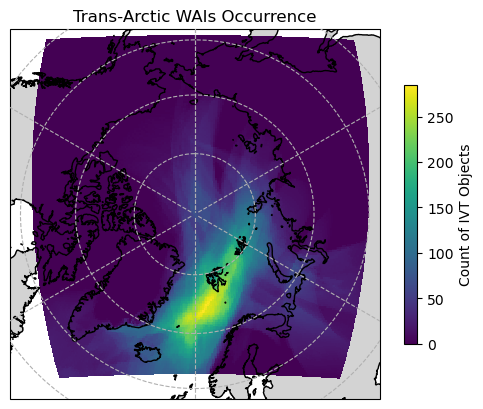

In [119]:
fig, ax = plt.subplots(1, 1,subplot_kw={'projection': ccrs.Orthographic(0,90)})

lats = ds_moaap_DJF_filtered.rlat
lons = ds_moaap_DJF_filtered.rlon

count = ax.pcolormesh(lons, lats, TA_WAIs_his, cmap='viridis',transform=crs_rot)#,vmin=0,vmax=18)#,cbar_kwargs={'extend':'neither','pad':0.01})

# Add the colorbar
cbar = fig.colorbar(count, ax=ax, orientation='vertical', shrink=0.7, pad=0.05)
cbar.set_label('Count of IVT Objects')


ax.set_extent([-180, 180, 58, 90], crs=ccrs.PlateCarree())
ax.set_title('Trans-Arctic WAIs Occurrence')
ax.gridlines(linestyle='--',zorder=3)
ax.coastlines(zorder=2)
ax.add_feature(cartopy.feature.LAND, color='lightgray',zorder=0, edgecolor='None') 
plt.show()

In [82]:
ivt_objects_his = ds_moaap_DJF_filtered_his.IVT_Objects.values  # shape: (time, lat, lon)
mask_his = np.isin(ivt_objects_his, list_ids_int_his)

#apply mask
ivt_masked_his = np.where(mask_his, ivt_objects_his, 0)

# For each grid cell, find the number of unique objects (ignoring 0)
TA_WAIs_his = np.apply_along_axis(lambda x: len(np.unique(x[x != 0])), axis=0, arr=ivt_masked_his)


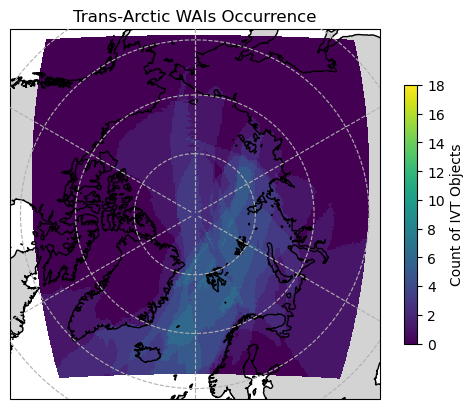

In [91]:
fig, ax = plt.subplots(1, 1,subplot_kw={'projection': ccrs.Orthographic(0,90)})

lats = ds_moaap_DJF_filtered.rlat
lons = ds_moaap_DJF_filtered.rlon

count = ax.pcolormesh(lons, lats, TA_WAIs_his, cmap='viridis',transform=crs_rot,vmin=0,vmax=18)#,cbar_kwargs={'extend':'neither','pad':0.01})

# Add the colorbar
cbar = fig.colorbar(count, ax=ax, orientation='vertical', shrink=0.7, pad=0.05)
cbar.set_label('Count of IVT Objects')


ax.set_extent([-180, 180, 58, 90], crs=ccrs.PlateCarree())
ax.set_title('Trans-Arctic WAIs Occurrence')
ax.gridlines(linestyle='--',zorder=3)
ax.coastlines(zorder=2)
ax.add_feature(cartopy.feature.LAND, color='lightgray',zorder=0, edgecolor='None') 
plt.show()

In [48]:
TA_frequency_change = TA_WAIs_SSP - TA_WAIs_his

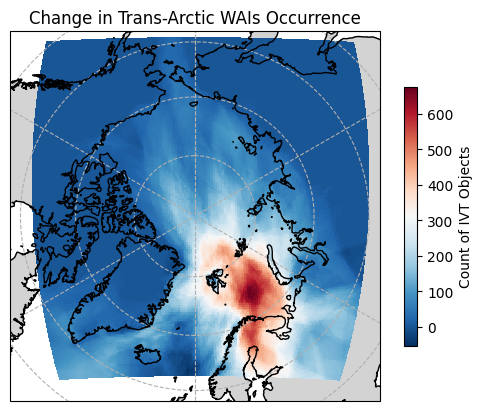

In [49]:

fig, ax = plt.subplots(1, 1,subplot_kw={'projection': ccrs.Orthographic(0,90)})

lats = ds_moaap_DJF_filtered.rlat
lons = ds_moaap_DJF_filtered.rlon

count = ax.pcolormesh(lons, lats, TA_frequency_change, cmap='RdBu_r',transform=crs_rot)#,cbar_kwargs={'extend':'neither','pad':0.01})

# Add the colorbar
cbar = fig.colorbar(count, ax=ax, orientation='vertical', shrink=0.7, pad=0.05)
cbar.set_label('Count of IVT Objects')


ax.set_extent([-180, 180, 58, 90], crs=ccrs.PlateCarree())
ax.set_title('Change in Trans-Arctic WAIs Occurrence')
ax.gridlines(linestyle='--',zorder=3)
ax.coastlines(zorder=2)
ax.add_feature(cartopy.feature.LAND, color='lightgray',zorder=0, edgecolor='None') 
plt.show()



In [1]:
import cartopy
import matplotlib

print("Matplotlib version:", matplotlib.__version__)
print("Cartopy version:", cartopy.__version__)

Matplotlib version: 3.8.4
Cartopy version: 0.24.1


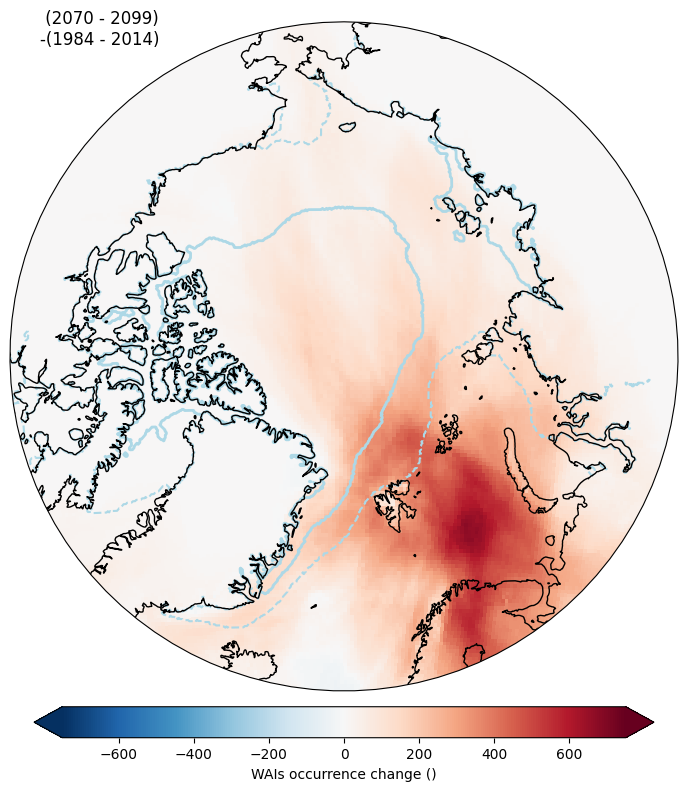

In [50]:

cmap='RdBu_r'
fig, ax = plt.subplots(1,1,subplot_kw={'projection': ccrs.Orthographic(0,90)},figsize=(10,10))

lats = ds_moaap_DJF_filtered.rlat
lons = ds_moaap_DJF_filtered.rlon
count = ax.pcolormesh(lons, lats, TA_frequency_change, cmap=cmap,transform=crs_rot,vmin=-750,vmax=750)#,cbar_kwargs={'extend':'neither','pad':0.01})
  
# Add custom colorbar
colorbar = plt.colorbar(count, ax=ax, orientation='horizontal', pad=0.06, shrink=0.8,extend='both')
colorbar.set_label('WAIs occurrence change ()', fontsize=10)
colorbar.ax.tick_params(labelsize=10)


#Add sea ice
contour = (sea_ice_edge>50).plot.contour(levels=1, ax = ax, transform = crs_rot, colors = 'lightblue', linewidths = 1.5, linestyles = '--',zorder=1)
contour = (sea_ice_edge>85).plot.contour(levels=1, ax = ax, transform = crs_rot, colors = 'lightblue', linewidths = 2, linestyles = '-',zorder=1)

#Add domain mask
#for domain in domains: 
#    mask_domains[domain]["mask"].plot.contour(levels=1,colors=mask_domains[domain]["color"],\
#        linewidths=1,linestyles='--',zorder=4,ax=ax,transform=ccrs.PlateCarree())

ax.set_aspect('equal')
center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)), np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

ax.set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
#ax.gridlines(linestyle='--',zorder=3)
ax.coastlines(zorder=2)

ax.add_feature(cartopy.feature.LAND, color='lightgray',zorder=0, edgecolor='None') 

ax.set_title(" (2070 - 2099) \n-(1984 - 2014)",loc='left')

plt.savefig('/work/aa0049/a271122/ICON_CNRM/frequency_change_CNRM.png')
plt.show()



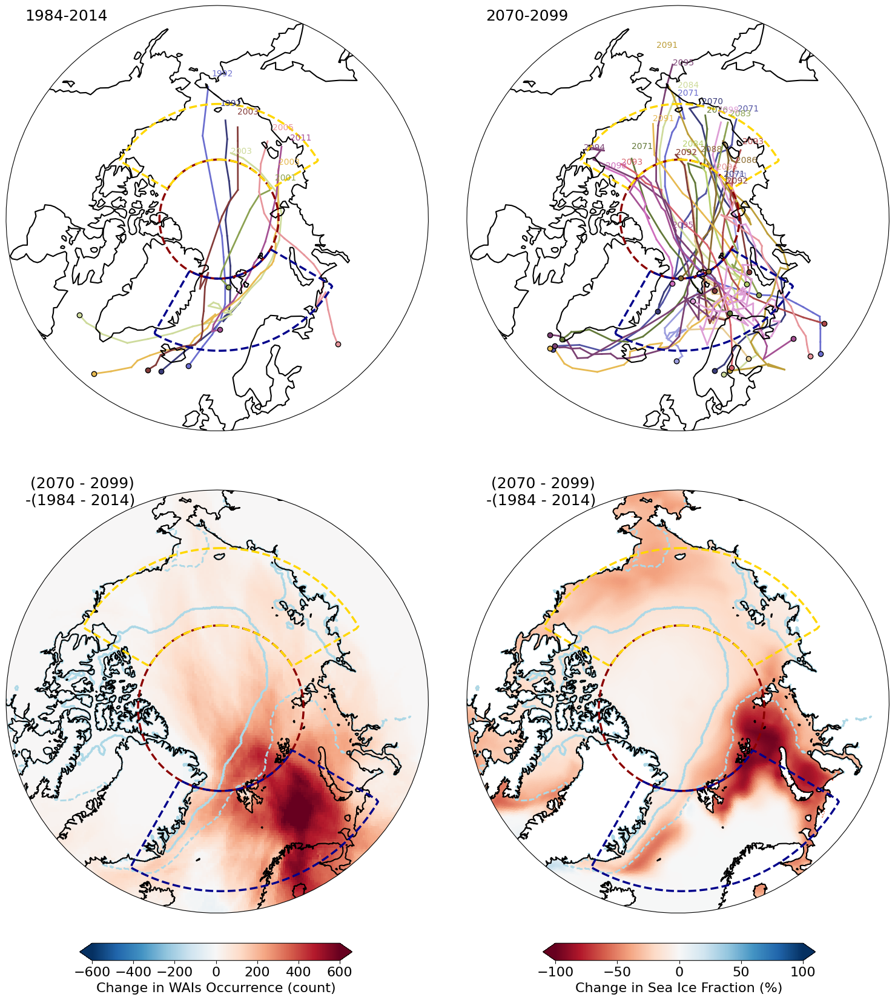

In [53]:
fig, axs = plt.subplots(2, 2,subplot_kw={'projection': ccrs.Orthographic(0,90)},figsize=(18,19))
ax = axs.flatten()

#############Figure A####################
for i in range(len(objs_final_his)):
    track = objs_final_his[i].track.values
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track])  

    if isinstance(df_objs, pd.DataFrame):
        obj_id = objs_final_his[i]['id_'].item()
        obj_color = df_objs_his[df_objs_his['id'] == obj_id].color.item()
        
        # Only once per object
        ax[0].text(track_lons[-1], track_lats[-1],
                str(pd.to_datetime(objs_final_his[i].times[0].values).strftime('%Y')),
                fontsize=10, transform=crs_rot, color=obj_color, zorder=12)

        ax[0].scatter(track_lons[0], track_lats[0],
                   facecolor=obj_color, edgecolor='k',
                   transform=crs_rot, zorder=12)

        # Now draw the lines
        for j in range(0, len(track_lats) - 6, 6):
            lat_start = track_lats[j]
            lon_start = track_lons[j]
            lat_end = track_lats[j + 6]
            lon_end = track_lons[j + 6]
            ax[0].plot([lon_start, lon_end], [lat_start, lat_end],
                    color=obj_color, transform=crs_rot, linewidth=2)

ax[0].set_extent([-180, 180, 55, 90], crs=ccrs.PlateCarree())

center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)),
                               np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax[0].set_boundary(circle, transform=ax[0].transAxes)
#############Figure B####################

for i in range(len(objs_final)):
    track = objs_final[i].track.values
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track])  

    if isinstance(df_objs, pd.DataFrame):
        obj_id = objs_final[i]['id_'].item()
        obj_color = df_objs[df_objs['id'] == obj_id].color.item()
        
        # Only once per object
        ax[1].text(track_lons[-1], track_lats[-1],
                str(pd.to_datetime(objs_final[i].times[0].values).strftime('%Y')),
                fontsize=10, transform=crs_rot, color=obj_color, zorder=12)

        ax[1].scatter(track_lons[0], track_lats[0],
                   facecolor=obj_color, edgecolor='k',
                   transform=crs_rot, zorder=12)

        # Now draw the lines
        for j in range(0, len(track_lats) - 6, 6):
            lat_start = track_lats[j]
            lon_start = track_lons[j]
            lat_end = track_lats[j + 6]
            lon_end = track_lons[j + 6]
            ax[1].plot([lon_start, lon_end], [lat_start, lat_end],
                    color=obj_color, transform=crs_rot, linewidth=2)


ax[1].set_extent([-180, 180, 55, 90], crs=ccrs.PlateCarree())

center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)),
                               np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax[1].set_boundary(circle, transform=ax[1].transAxes)
################Figure C#########################################

lats = ds_moaap_DJF_filtered.rlat
lons = ds_moaap_DJF_filtered.rlon
count = ax[2].pcolormesh(lons, lats, TA_frequency_change, cmap='RdBu_r',
                         transform=crs_rot, vmin=-600, vmax=600)

# Create a colorbar axis manually below ax[2]
cax = fig.add_axes([0.175, 0.06, 0.25, 0.015])  # [left, bottom, width, height]
colorbar = plt.colorbar(count, cax=cax, orientation='horizontal',extend='both')
colorbar.set_label('Change in WAIs Occurrence (count)', fontsize=16)
colorbar.ax.tick_params(labelsize=16)

#Add sea ice
contour = (sea_ice_edge>50).plot.contour(levels=1, ax = ax[2], transform = crs_rot, colors = 'lightblue', linewidths = 2, linestyles = '--',zorder=1)
contour = (sea_ice_edge>85).plot.contour(levels=1, ax = ax[2], transform = crs_rot, colors = 'lightblue', linewidths = 2.5, linestyles = '-',zorder=1)


ax[2].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())

center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)),
                               np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax[2].set_boundary(circle, transform=ax[2].transAxes)

##############Figure D###########################################

variable = sea_ice_edge_change.plot(ax=ax[3], transform=crs_rot,
                                    cmap='RdBu', vmin=-100, vmax=100,
                                    add_colorbar=False)

cax = fig.add_axes([0.6, 0.06, 0.25, 0.015])  # Adjust placement
colorbar = plt.colorbar(variable, cax=cax, orientation='horizontal',extend='both')
colorbar.set_label('Change in Sea Ice Fraction (%)', fontsize=16)
colorbar.ax.tick_params(labelsize=16)


#Add sea ice
contour = (sea_ice_edge>50).plot.contour(levels=1, ax = ax[3], transform = crs_rot, colors = 'lightblue', linewidths = 2, linestyles = '--',zorder=1)
contour = (sea_ice_edge>85).plot.contour(levels=1, ax = ax[3], transform = crs_rot, colors = 'lightblue', linewidths = 2.5, linestyles = '-',zorder=1)

ax[3].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())

center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)),
                               np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax[3].set_boundary(circle, transform=ax[3].transAxes)


for axes in ax: 

    for domain_name, domain_data in mask_domains.items():
        domain_data["mask"].plot.contour(levels=1,colors=domain_data["color"],linewidths=2.5,linestyles='--',zorder=4,ax=axes,transform=ccrs.PlateCarree())


    axes.coastlines(zorder=3,linewidth=1.5)
    axes.add_feature(cartopy.feature.LAND, color='white',zorder=0, edgecolor='None') 


ax[0].set_title("1984-2014",loc='left',fontsize=18.)
ax[1].set_title("2070-2099",loc='left',fontsize=18.)
ax[2].set_title(" (2070 - 2099) \n-(1984 - 2014)",loc='left',fontsize=18.)
ax[3].set_title(" (2070 - 2099) \n-(1984 - 2014)",loc='left',fontsize=18.)


#plt.tight_layout()
plt.savefig('/work/aa0049/a271122/ICON_CNRM/Intro_CNRM.png',dpi=300,bbox_inches='tight')
plt.show()



#### tas (T_2M)

In [14]:
list_ids = [objs_final[i]['id_'].item() for i in range(len(objs_final))]

In [15]:
tas_shape_list, tas_clim_list, tas_anomaly_list = create_and_store_lists('tas','tas','70-99',
                                                                         domains,ICON_CNRM_path,ICON_clim_path,
                                                                         objs_final,ds_moaap,ssp=True,
                                                                         startdate="2070-01-01", enddate="2099-12-31")

/work/aa0049/a271041/CMOR/CORDEX-CMIP6/DD/ARC-12/CLMcom-AWI/CNRM-ESM2-1/ssp370/r1i1p1f2/ICON-CLM-202401-1-1/v1-r1/1hr/tas/v20250601/tas_*.nc


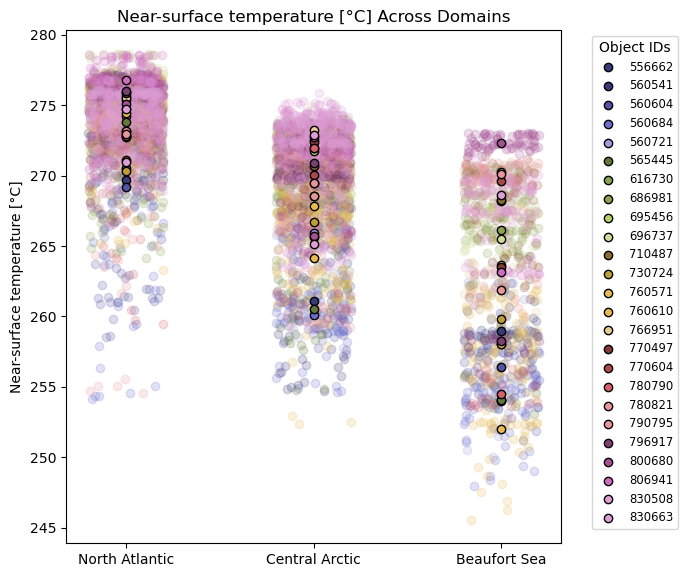

In [54]:
plot_scatter_domains(tas_shape_list[0], tas_shape_list[1], tas_shape_list[2], list_ids, f'Near-surface temperature [°C]',f'Near-surface temperature [°C] Across Domains', savefig = False)

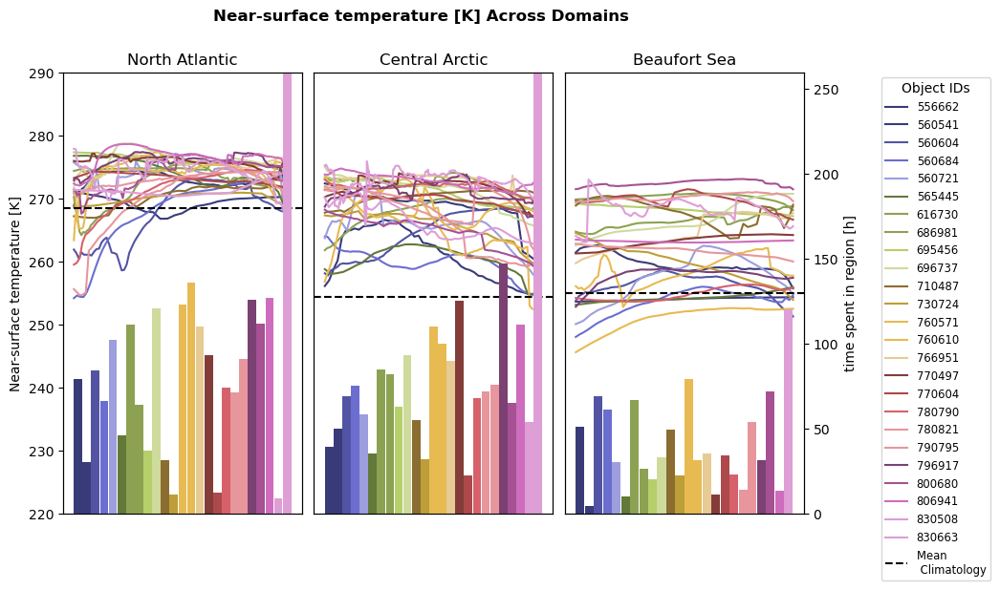

In [55]:
plot_masked_shapes_clim(tas_shape_list[0], tas_shape_list[1], tas_shape_list[2],
                                   tas_clim_list[0]['tas'].mean(dim=("rlat","rlon")),tas_clim_list[1]['tas'].mean(dim=("rlat","rlon")),tas_clim_list[2]['tas'].mean(dim=("rlat","rlon")),
                                   list_ids, f'Near-surface temperature [K]', f'Near-surface temperature [K] Across Domains',vmin=220,vmax=290, savefig = False,clim=True,bars=True)

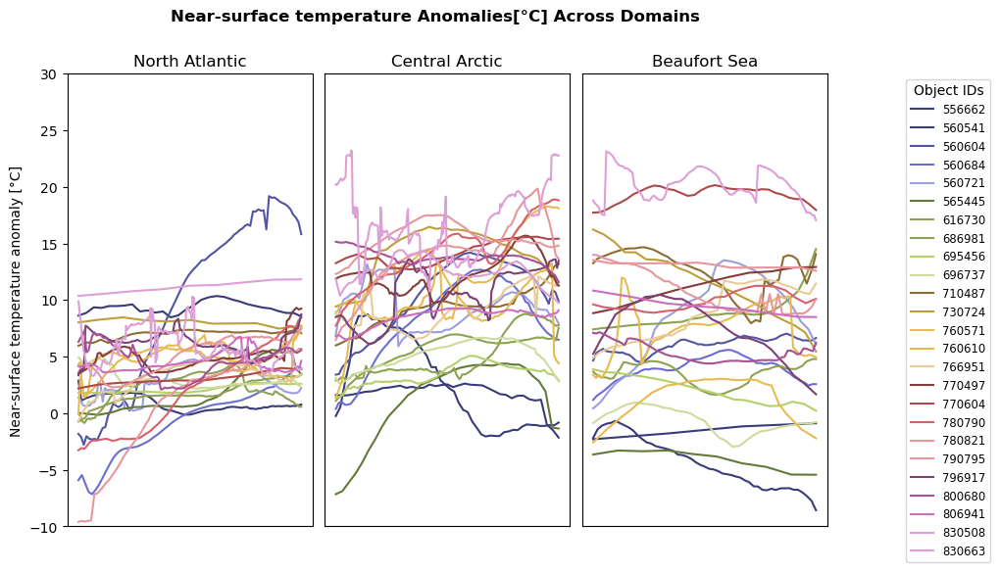

In [61]:
plot_masked_shapes_clim(tas_anomaly_list[0], tas_anomaly_list[1], tas_anomaly_list[2],
                                   tas_clim_list[0]['tas'].mean(dim=("rlat","rlon"))-273.15,tas_clim_list[1]['tas'].mean(dim=("rlat","rlon"))-273.15,tas_clim_list[2]['tas'].mean(dim=("rlat","rlon"))-273.15,
                                   list_ids,f'Near-surface temperature anomaly [°C]', f'Near-surface temperature Anomalies[°C] Across Domains',vmin=-10,vmax=30,bars=False)

#### prw (TQV)

In [15]:
prw_shape_list, prw_clim_list = get_shapes_and_clim('prw','prw',domains,
                                            ICON_CNRM_path,ICON_clim_path,
                                            objs_final,ds_moaap,ssp=True,
                                            period='70-99',startdate="2070-01-01", enddate="2099-12-31")

/work/aa0049/a271041/CMOR/CORDEX-CMIP6/DD/ARC-12/CLMcom-AWI/CNRM-ESM2-1/ssp370/r1i1p1f2/ICON-CLM-202401-1-1/v1-r1/1hr/prw/v20250601/prw_*.nc


In [16]:
prw_shape_list = [[da.compute() for da in sublist] for sublist in prw_shape_list]
prw_clim_list = [ds.compute() for ds in prw_clim_list]

In [17]:
with open(f'{ICON_clim_path}shapelists/prw_shape_list_70-99.pkl', 'wb') as f:
    pickle.dump(prw_shape_list,f) 

In [18]:
with open(f'{ICON_clim_path}shapelists/prw_clim_list_70-99.pkl', 'wb') as f:
    pickle.dump(prw_clim_list,f) 

In [67]:
with open(f'{ICON_clim_path}shapelists/prw_shape_list_70-99.pkl', 'rb') as f:
   prw_shape_list = pickle.load(f) 

In [68]:
with open(f'{ICON_clim_path}shapelists/prw_clim_list_70-99.pkl', 'rb') as f:
   prw_clim_list = pickle.load(f) 

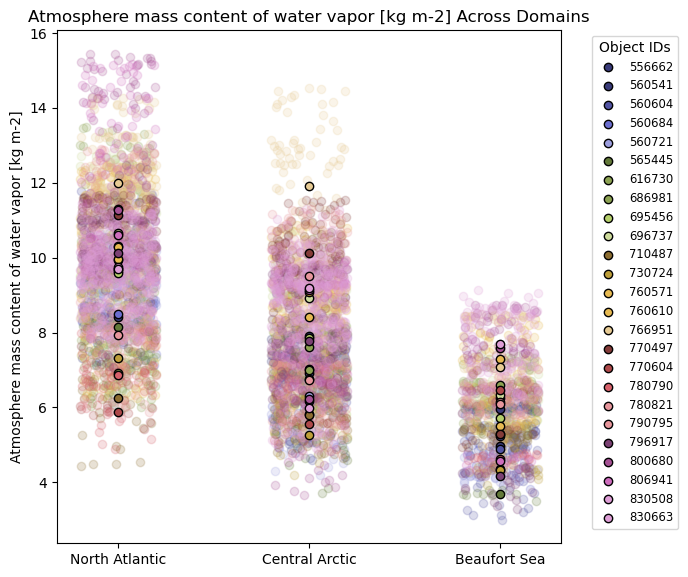

In [40]:
plot_scatter_domains(prw_shape_list[0], prw_shape_list[1], prw_shape_list[2], list_ids, f'Atmosphere mass content of water vapor [kg m-2]',f'Atmosphere mass content of water vapor [kg m-2] Across Domains', savefig = False)

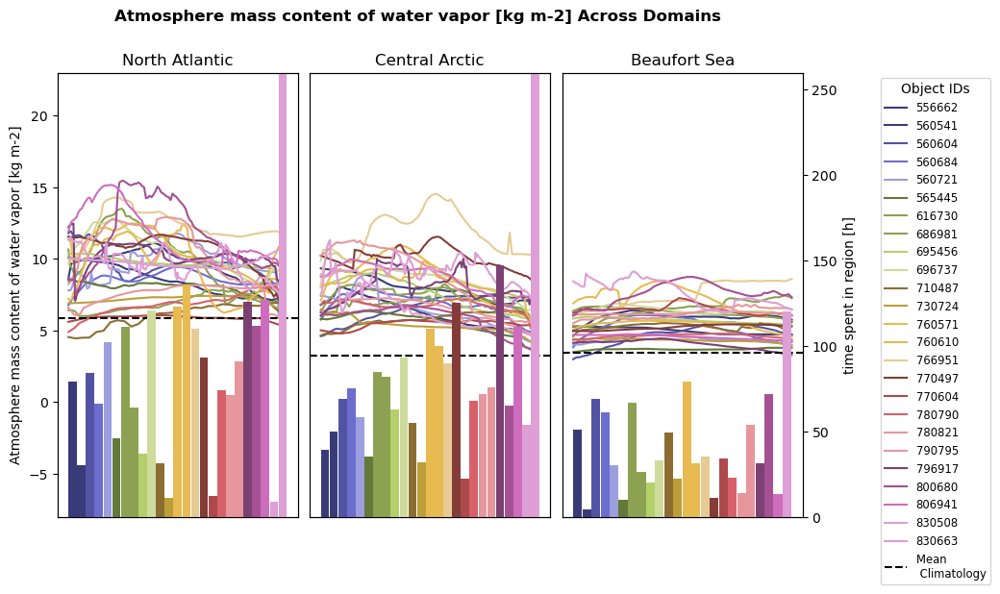

In [41]:
plot_masked_shapes_clim(prw_shape_list[0], prw_shape_list[1], prw_shape_list[2],
                                   prw_clim_list[0]['prw'].mean(dim=("rlat","rlon")),prw_clim_list[1]['prw'].mean(dim=("rlat","rlon")),prw_clim_list[2]['prw'].mean(dim=("rlat","rlon")),
                                   list_ids, f'Atmosphere mass content of water vapor [kg m-2]', f'Atmosphere mass content of water vapor [kg m-2] Across Domains',vmin=-8,vmax=23, savefig = False,clim=True,bars=True)

In [19]:
prw_anomaly_list = get_anomaly_shapes('prw','prw',domains,
                                            ICON_CNRM_path,ICON_clim_path,
                                            objs_final,ds_moaap,ssp=True,
                                            period='70-99',startdate="2070-01-01", enddate="2099-12-31")

In [20]:
prw_anomaly_list = [[da.compute() for da in sublist] for sublist in prw_anomaly_list]

In [23]:
with open(f'{ICON_clim_path}shapelists/prw_anomaly_list_70-99.pkl', 'wb') as f:
    pickle.dump(prw_anomaly_list,f) 

In [24]:
with open(f'{ICON_clim_path}shapelists/prw_anomaly_list_70-99.pkl', 'rb') as f:
   prw_anomaly_list = pickle.load(f) 

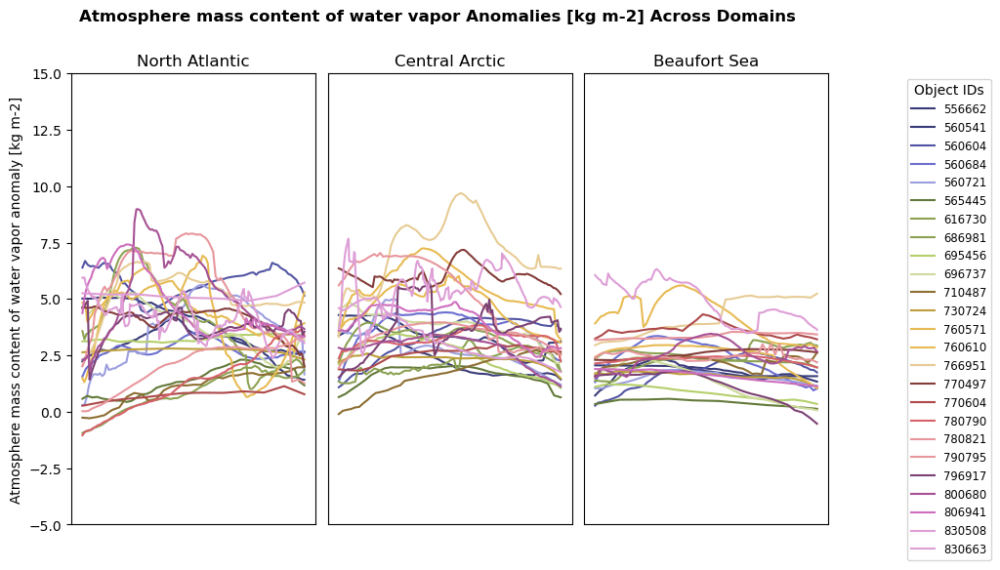

In [76]:
plot_masked_shapes_clim(prw_anomaly_list[0], prw_anomaly_list[1], prw_anomaly_list[2],
                                   prw_clim_list[0]['prw'].mean(dim=("rlat","rlon")),prw_clim_list[1]['prw'].mean(dim=("rlat","rlon")),prw_clim_list[2]['prw'].mean(dim=("rlat","rlon")),
                                   list_ids,f'Atmosphere mass content of water vapor anomaly [kg m-2]', f'Atmosphere mass content of water vapor Anomalies [kg m-2] Across Domains',vmin=-5,vmax=15,bars=False)

#### rlds (ATHD_S)

In [17]:
rlds_shape_list, rlds_clim_list = get_shapes_and_clim('rlds','rlds',domains,
                                            ICON_CNRM_path,ICON_clim_path,
                                            objs_final,ds_moaap,ssp=True,
                                            period='70-99',startdate="2070-01-01", enddate="2099-12-31")

/work/aa0049/a271041/CMOR/CORDEX-CMIP6/DD/ARC-12/CLMcom-AWI/CNRM-ESM2-1/ssp370/r1i1p1f2/ICON-CLM-202401-1-1/v1-r1/1hr/rlds/v20250601/rlds_*.nc


In [18]:
rlds_shape_list = [[da.compute() for da in sublist] for sublist in rlds_shape_list]

In [19]:
rlds_clim_list = [ds.compute() for ds in rlds_clim_list]

In [20]:
with open(f'{ICON_clim_path}shapelists/rlds_shape_list_70-99.pkl', 'wb') as f:
    pickle.dump(rlds_shape_list,f) 

In [21]:
with open(f'{ICON_clim_path}shapelists/rlds_clim_list_70-99.pkl', 'wb') as f:
    pickle.dump(rlds_clim_list,f) 

In [77]:
with open(f'{ICON_clim_path}shapelists/rlds_shape_list_70-99.pkl', 'rb') as f:
   rlds_shape_list = pickle.load(f) 

In [40]:
with open(f'{ICON_clim_path}shapelists/rlds_clim_list_70-99.pkl', 'rb') as f:
   rlds_clim_list = pickle.load(f) 

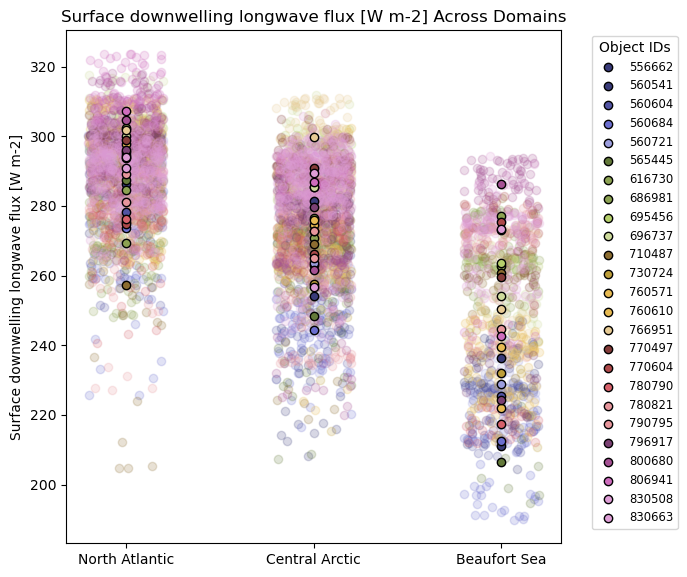

In [83]:
plot_scatter_domains(rlds_shape_list[0], rlds_shape_list[1], rlds_shape_list[2], list_ids, f'Surface downwelling longwave flux [W m-2]',f'Surface downwelling longwave flux [W m-2] Across Domains', savefig = False)

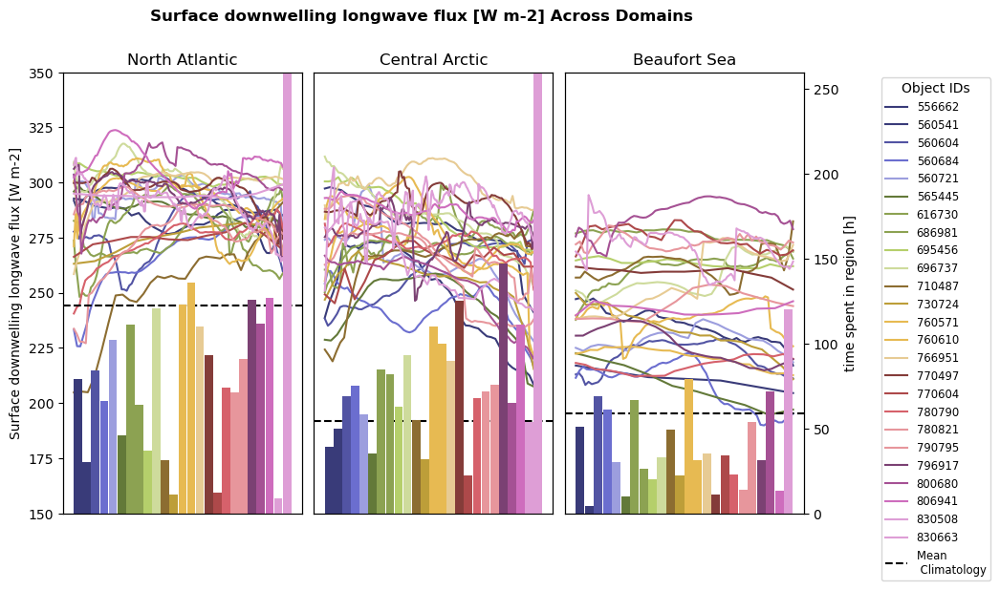

In [84]:
plot_masked_shapes_clim(rlds_shape_list[0], rlds_shape_list[1], rlds_shape_list[2],
                                   rlds_clim_list[0]['rlds'].mean(dim=("rlat","rlon")),rlds_clim_list[1]['rlds'].mean(dim=("rlat","rlon")),rlds_clim_list[2]['rlds'].mean(dim=("rlat","rlon")),
                                   list_ids, f'Surface downwelling longwave flux [W m-2]', f'Surface downwelling longwave flux [W m-2] Across Domains',vmin=150,vmax=350, savefig = False,clim=True,bars=True)

In [22]:
rlds_anomaly_list = get_anomaly_shapes('rlds','rlds',domains,
                                       ICON_CNRM_path,ICON_clim_path,
                                       objs_final,ds_moaap,ssp=True,
                                       period='70-99',startdate="2070-01-01", enddate="2099-12-31")

In [23]:
rlds_anomaly_list = [[da.compute() for da in sublist] for sublist in rlds_anomaly_list]

In [24]:
with open(f'{ICON_clim_path}shapelists/rlds_anomaly_list_70-99.pkl', 'wb') as f:
    pickle.dump(rlds_anomaly_list,f) 

In [25]:
with open(f'{ICON_clim_path}shapelists/rlds_anomaly_list_70-99.pkl', 'rb') as f:
   rlds_anomaly_list = pickle.load(f) 

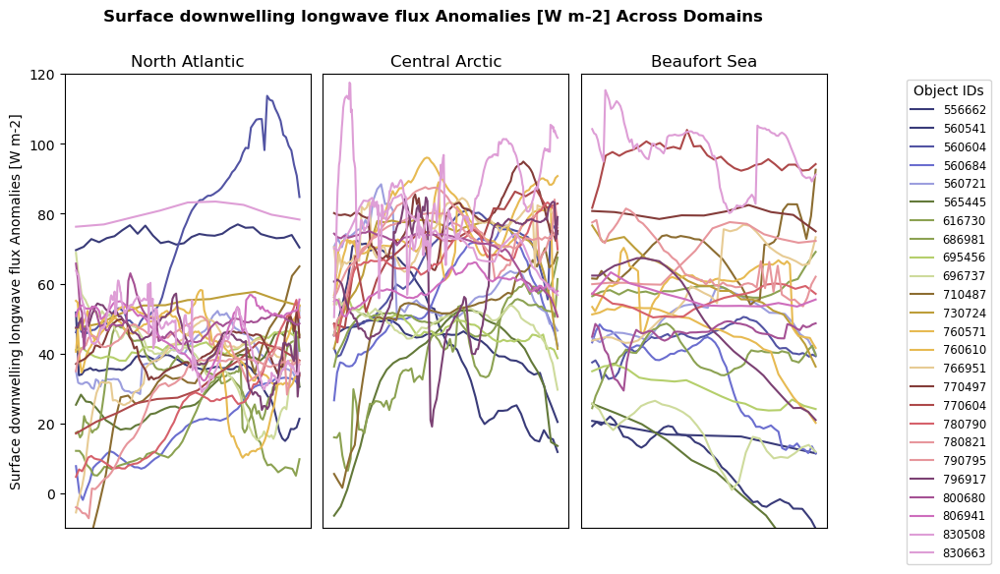

In [50]:
plot_masked_shapes_clim(rlds_anomaly_list[0], rlds_anomaly_list[1], rlds_anomaly_list[2],
                                   rlds_clim_list[0]['rlds'],rlds_clim_list[1]['rlds'],rlds_clim_list[2]['rlds'],
                                   list_ids,f'Surface downwelling longwave flux Anomalies [W m-2]', f'Surface downwelling longwave flux Anomalies [W m-2] Across Domains',vmin=-10,vmax=120,bars=False)

#### sfcWind

In [23]:
sfcWind_shape_list, sfcWind_clim_list, sfcWind_anomaly_list = create_and_store_lists('sfcWind','sfcWind','70-99',
                                                                            domains,ICON_CNRM_path,ICON_clim_path,
                                                                            objs_final,ds_moaap,ssp=True,
                                                                           startdate="2070-01-01", enddate="2099-12-31")

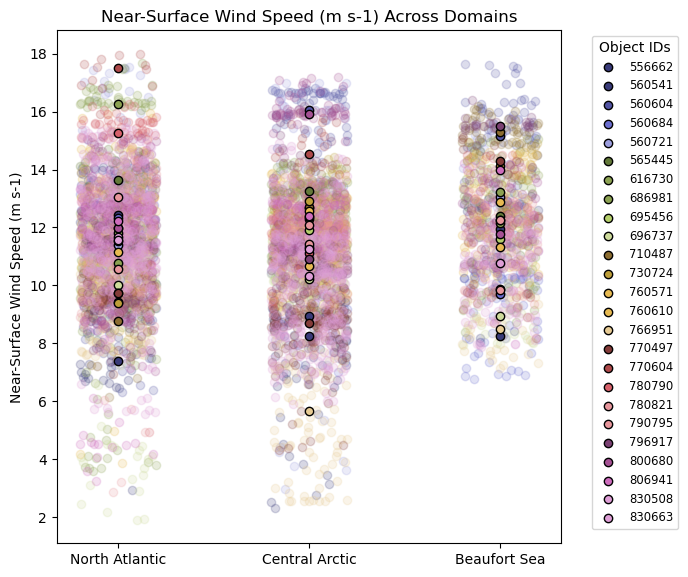

In [24]:
plot_scatter_domains(sfcWind_shape_list[0], sfcWind_shape_list[1], sfcWind_shape_list[2], list_ids, 
                     f'Near-Surface Wind Speed (m s-1)',f'Near-Surface Wind Speed (m s-1) Across Domains', savefig = False)

#### hfls

In [25]:
hfls_shape_list, hfls_clim_list, hfls_anomaly_list = create_and_store_lists('hfls','hfls','70-99',
                                                                            domains,ICON_CNRM_path,ICON_clim_path,
                                                                           objs_final,ds_moaap,ssp=True,
                                                                           startdate="2070-01-01", enddate="2099-12-31")

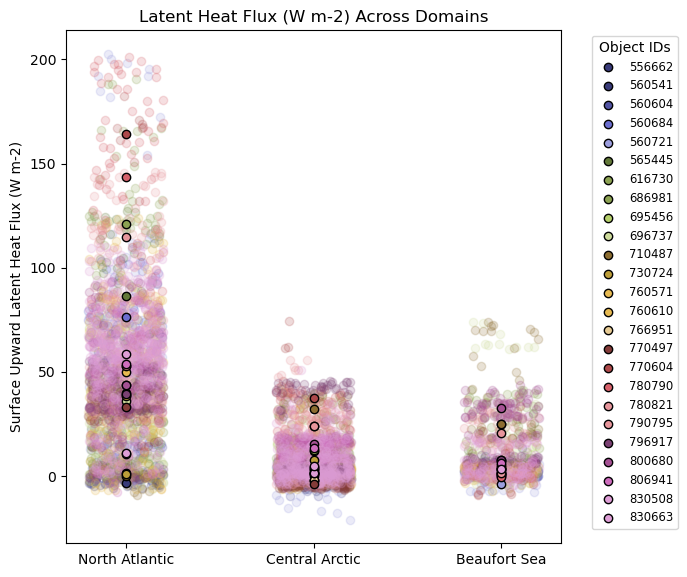

In [26]:
plot_scatter_domains(hfls_shape_list[0], hfls_shape_list[1], hfls_shape_list[2], list_ids,
                     f'Surface Upward Latent Heat Flux (W m-2)',f'Latent Heat Flux (W m-2) Across Domains', savefig = False)

#### hfss

In [27]:
hfss_shape_list, hfss_clim_list, hfss_anomaly_list = create_and_store_lists('hfss','hfss','70-99',
                                                                            domains,ICON_CNRM_path,ICON_clim_path,
                                                                            objs_final,ds_moaap,ssp=True,
                                                                            startdate="2070-01-01", enddate="2099-12-31")

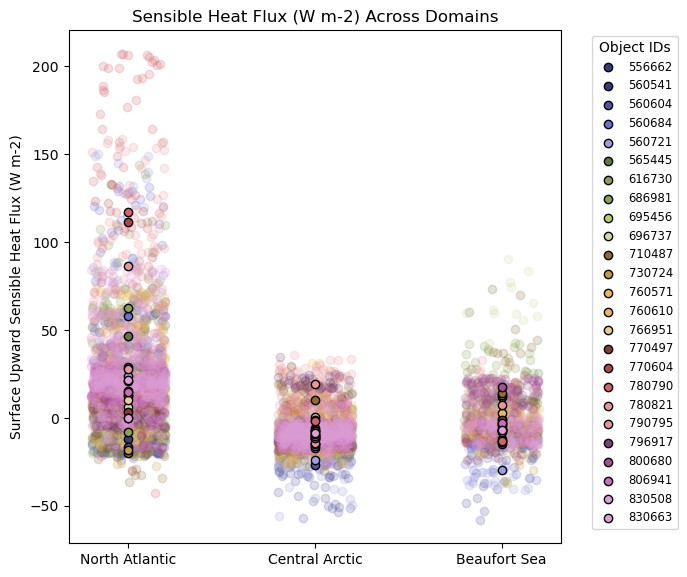

In [28]:
plot_scatter_domains(hfss_shape_list[0], hfss_shape_list[1], hfss_shape_list[2], list_ids, 
                     f'Surface Upward Sensible Heat Flux (W m-2)',f'Sensible Heat Flux (W m-2) Across Domains', savefig = False)

#### pr

In [29]:
pr_shape_list, pr_clim_list, pr_anomaly_list = create_and_store_lists('pr','pr','70-99',
                                                                      domains,ICON_CNRM_path,ICON_clim_path,
                                                                      objs_final,ds_moaap,ssp=True,
                                                                      startdate="2070-01-01", enddate="2099-12-31") #*3600

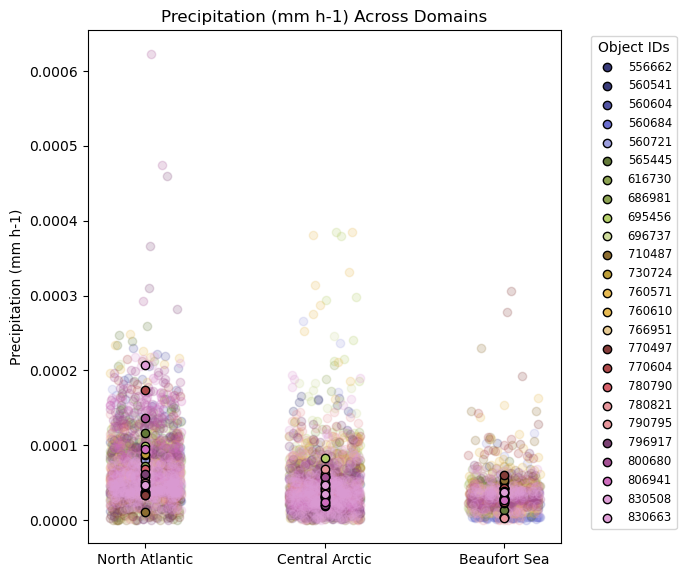

In [30]:
plot_scatter_domains(pr_shape_list[0], pr_shape_list[1], pr_shape_list[2], list_ids, 
                     f'Precipitation (mm h-1)',f'Precipitation (mm h-1) Across Domains', savefig = False)

#### clwvi

In [25]:
clwvi_shape_list, clwvi_clim_list, clwvi_anomaly_list = create_and_store_lists('clwvi','clwvi','70-99',
                                                                            domains,ICON_CNRM_path,ICON_clim_path,
                                                                           objs_final,ds_moaap,ssp=True,
                                                                           startdate="2070-01-01", enddate="2099-12-31")

/work/aa0049/a271041/CMOR_attr/ARC-11/AWI/CNRM-ESM2-1/ssp370/r1i1p1f2/AWI-ICON2-6-6/v1/1hr/clwvi/clwvi_*.nc


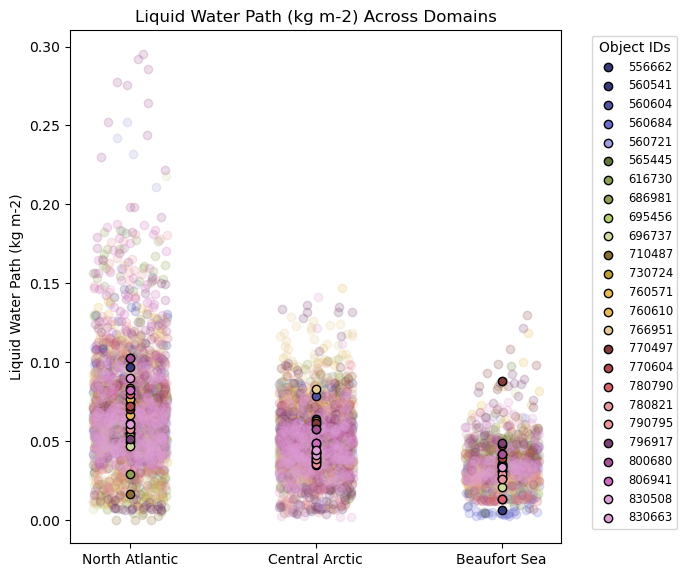

In [32]:
plot_scatter_domains(clwvi_shape_list[0], clwvi_shape_list[1], clwvi_shape_list[2], list_ids, 
                     f'Liquid Water Path (kg m-2)',f'Liquid Water Path (kg m-2) Across Domains', savefig = False)

#### clivi

In [33]:
clivi_shape_list, clivi_clim_list, clivi_anomaly_list = create_and_store_lists('clivi','clivi','70-99',
                                                                            domains,ICON_CNRM_path,ICON_clim_path,
                                                                           objs_final,ds_moaap,ssp=True,
                                                                           startdate="2070-01-01", enddate="2099-12-31")

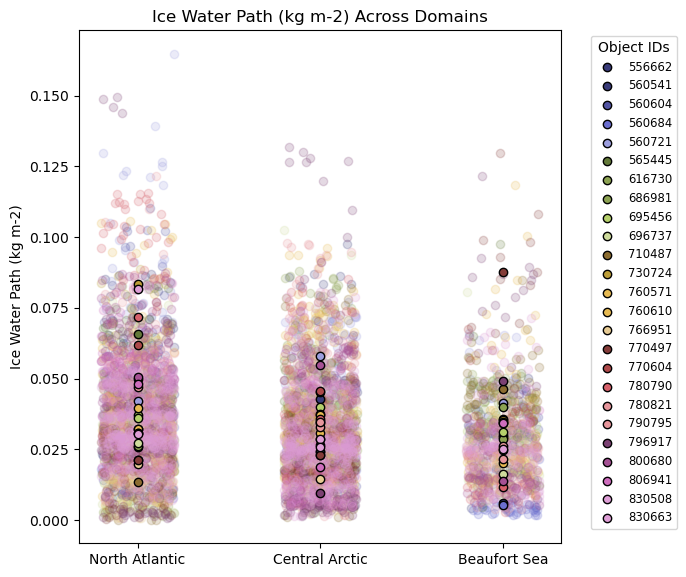

In [34]:
plot_scatter_domains(clivi_shape_list[0], clivi_shape_list[1], clivi_shape_list[2], list_ids, 
                     f'Ice Water Path (kg m-2)',f'Ice Water Path (kg m-2) Across Domains', savefig = False)

### Animations

In [27]:
def add_custom_colorbar(mappable, ax, ds, var_):

    standard_name = ds[var_].attrs.get('standard_name', var_)
    units = ds[var_].attrs.get('units', '')
    cbar = plt.colorbar(mappable, ax=ax, orientation='vertical', pad=0.08, shrink=0.6, extend='both')
    cbar.set_label(f'{var_} [{units}]', fontsize=12)
    cbar.ax.tick_params(labelsize=12)

In [18]:

def plot_subplot_anomalies(tt, variables, variable_names, variable_cmaps, ds_moaap, df_objs, objs, objs_plot_ids, crs_rot, mask_domains=None,savefig=False):
    """
    Create a 2x3 subplot of IVT and other variables at time `tt`.

    Parameters:
        tt: datetime-like object
        variables: list of 6 variable folder names (first one should be 'IVT')
        variable_names: list of 6 variable data names in the NetCDF files
        variable_cmaps: list of 6 colormaps for plotting
        enddate: string, end date for loading variable files
        ds_moaap: main dataset with IVT and object tracking
        df_objs: dataframe with object info (id, color)
        objs: list of object data (with track, speed, etc.)
        objs_plot_ids: list of object ids to highlight
        crs_rot: rotated pole CRS
        mask_domains: dict of domains with masks and colors (optional)
    """
    fig, axs = plt.subplots(2, 3, figsize=(18, 10),
                            subplot_kw={'projection': ccrs.Orthographic(0, 90)})
    axs = axs.flatten()


    vmin_vmax_dict = {
        'psl': (-1500, 1500),
        'tas': (-12, 12),
        'pr': (-0.1, 0.1),
        'tcc': (-20, 20),
        'hcc': (-20, 20),
        'mcc': (-20, 20),
        'lcc': (-20, 20),
        'rlds':(-65, 65),
        'hfls':(-65, 65),
        'hfss':(-65, 65),
        'sic': (0, 100)
    }

    for i in range(6):
        ax = axs[i]
        ax.clear()
        ax.set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
        ax.gridlines(linestyle='--', zorder=3)
        ax.coastlines(zorder=2)
        ax.add_feature(cartopy.feature.LAND, color='lightgray', alpha=1, zorder=0, edgecolor='black')
        ax.add_feature(cartopy.feature.OCEAN, color='white', zorder=0, edgecolor='black')
        fig.suptitle(f'Transarctic WAIs (IVT Objects) and large-scale features for ICON-CNRM SSP3.70 DJF | {pd.to_datetime(tt.values)}',fontweight='bold',y=0.97) #,ha='right' 
        
        # Clip to circle
        center, radius = [0.5, 0.5], 0.55
        circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)),
                                       np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
        ax.set_boundary(circle, transform=ax.transAxes)

        if i == 0:
            # Plot IVT
            ds_moaap_sel = ds_moaap.sel(time=tt, method='nearest').compute()
            ds_IVT = ds_moaap_sel.IVT.plot(x='rlon', y='rlat', ax=ax, vmin=0, vmax=250,
                cmap=variable_cmaps[i], transform=crs_rot,add_colorbar=False)

            cbar = plt.colorbar(ds_IVT, ax=ax, orientation='vertical', pad=0.08, shrink=0.8, extend='both')
            cbar.set_label('IVT [kg m-1 s-1]', fontsize=10)
            cbar.ax.tick_params(labelsize=10)
        else:
            # Plot climate variable
            var = variables[i]
            var_ = variable_names[i]

            # Default padding between colorbar and map
            vmin, vmax = vmin_vmax_dict.get(var, (None, None))
            
            ds = xr.open_mfdataset(f'{ICON_CNRM_path}{var}/{var}_*.nc',chunks = {'time':10})
            ds_clim = xr.open_dataset(f'{ICON_clim_path}/clim/{var}/{var}_clim_day_DJF_ssp_70-99.nc',chunks={'time': 10})

            #Compute anomaly
            tt_dt = pd.to_datetime(tt.values)
            month = tt_dt.month
            day = tt_dt.day
            month_day_str = f"{month:02d}-{day:02d}"
            
            
            var_tot = ds[var_].sel(time=tt, method='nearest')
            
            var_clim = ds_clim[var_].sel(time=ds_clim.time.dt.strftime('%m-%d') == month_day_str)
            
            var_anom = var_tot - var_clim

            var_anom_plot = var_anom.plot(ax=ax, cmap=variable_cmaps[i], transform=crs_rot,vmin=vmin,vmax=vmax,add_colorbar=False)

            add_custom_colorbar(var_anom_plot, ax, ds, var_)

        # Plot tracked objects
        ds_moaap_sel = ds_moaap.sel(time=tt, method='nearest').compute()
        obj_ids_tt = np.unique(ds_moaap_sel.IVT_Objects)
        obj_ids_tt = obj_ids_tt[obj_ids_tt != 0].astype(int)

        for obj_id in obj_ids_tt:
            if (df_objs['id'] == str(obj_id)).any():
                obj_color = df_objs[df_objs['id'] == str(obj_id)].color.item()
            else:
                obj_color = 'b'

            lw = 3 if str(obj_id) in objs_plot_ids else 1

            if str(obj_id) in objs_plot_ids:
                obj_idx = df_objs[df_objs['id'] == str(obj_id)].index.item()
                track = objs[obj_idx].track
                track_lats = np.array([x.lat for x in track.values])
                track_lons = np.array([x.lon for x in track.values])
                track_tt = track.sel(times=tt, method='nearest')
                ax.scatter(track_tt.item().lon, track_tt.item().lat, transform=crs_rot,
                           facecolor=[obj_color], edgecolor='k', s=20)
                
                # Ensure longitudes are in -180 to 180 range
                #track_lons = ((track_lons + 180) % 360) - 180

                ax.plot(track_lons, track_lats, color=obj_color, lw=0.75, transform=crs_rot, zorder=15) #track
                ax.text(track_lons[-1], track_lats[-1], obj_id, transform=crs_rot, color=obj_color, zorder=11)

            (ds_moaap_sel.IVT_Objects == obj_id).plot.contour(x='rlon', y='rlat', ax=ax, levels=1,
                                                              colors=[obj_color], linewidths=lw,
                                                              transform=crs_rot, zorder=5)

        #Add sea ice
        sea_ice_edge.plot.contour(levels=1, ax = ax, transform = crs_rot, colors = 'cyan', linewidths = 1, linestyles = '-',zorder=1)


        # Optional domain outlines
        if mask_domains:
            for domain_name, domain_data in mask_domains.items():
                domain_data["mask"].plot.contour(levels=1, colors=domain_data["color"],
                                                 linewidths=1.5, linestyles='--',
                                                 zorder=4, ax=ax, transform=ccrs.PlateCarree())

        if i == 0: 
            ax.set_title("IVT", y=1.05)
        else: 
            ax.set_title(f"{variables[i]} Anomalies", y=1.05)

    if savefig==True:
        path_input_images='ICON_CNRM/'
        path_movies='/work/aa0049/a271122/scripts/movies/'
        plt.savefig(path_movies + path_input_images + f"{pd.to_datetime(tt.values).strftime('%Y-%m-%dT%H-%M')}.jpg",dpi=300)#,transparent=True)
        plt.close(fig)
        
    #plt.tight_layout()
    #plt.show()


In [29]:

def plot_subplot_anomalies_small(tt, variables, variable_names, variable_cmaps, ds_moaap, df_objs, objs, objs_plot_ids, crs_rot, mask_domains=None,savefig=False):
    """
    Create a 2x3 subplot of IVT and other variables at time `tt`.

    Parameters:
        tt: datetime-like object
        variables: list of 6 variable folder names (first one should be 'IVT')
        variable_names: list of 6 variable data names in the NetCDF files
        variable_cmaps: list of 6 colormaps for plotting
        enddate: string, end date for loading variable files
        ds_moaap: main dataset with IVT and object tracking
        df_objs: dataframe with object info (id, color)
        objs: list of object data (with track, speed, etc.)
        objs_plot_ids: list of object ids to highlight
        crs_rot: rotated pole CRS
        mask_domains: dict of domains with masks and colors (optional)
    """
    fig, axs = plt.subplots(1, 3, figsize=(18, 10),
                            subplot_kw={'projection': ccrs.Orthographic(0, 90)})
    axs = axs.flatten()


    vmin_vmax_dict = {
        'psl': (-1500, 1500),
        'tas': (-12, 12),
        'sic': (0, 100)
    }

    for i in range(3):
        ax = axs[i]
        ax.clear()
        ax.set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
        ax.gridlines(linestyle='--', zorder=3)
        ax.coastlines(zorder=2)
        ax.add_feature(cartopy.feature.LAND, color='lightgray', alpha=1, zorder=0, edgecolor='black')
        ax.add_feature(cartopy.feature.OCEAN, color='white', zorder=0, edgecolor='black')
        fig.suptitle(f'Transarctic WAIs (IVT Objects) and large-scale features for ICON-CNRM SSP3.70 DJF | {pd.to_datetime(tt.values)}',fontweight='bold',y=0.97) #,ha='right' 
        
        # Clip to circle
        center, radius = [0.5, 0.5], 0.55
        circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)),
                                       np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
        ax.set_boundary(circle, transform=ax.transAxes)

        if i == 0:
            # Plot IVT
            ds_moaap_sel = ds_moaap.sel(time=tt, method='nearest').compute()
            ds_IVT = ds_moaap_sel.IVT.plot(x='rlon', y='rlat', ax=ax, vmin=0, vmax=250,
                cmap=variable_cmaps[i], transform=crs_rot,add_colorbar=False)

            cbar = plt.colorbar(ds_IVT, ax=ax, orientation='vertical', pad=0.08, shrink=0.6, extend='both')
            cbar.set_label('IVT [kg m-1 s-1]', fontsize=10)
            cbar.ax.tick_params(labelsize=10)
        else:
            # Plot climate variable
            var = variables[i]
            var_ = variable_names[i]

            # Default padding between colorbar and map
            vmin, vmax = vmin_vmax_dict.get(var, (None, None))
            
            ds = xr.open_mfdataset(f'{ICON_CNRM_path}{var}/v20250601/{var}_*.nc',chunks = {'time':10})
            ds_clim = xr.open_dataset(f'{ICON_clim_path}/clim/{var}/{var}_clim_day_DJFM_ssp_70-99.nc',chunks={'time': 10})

            #Compute anomaly
            tt_dt = pd.to_datetime(tt.values)
            month = tt_dt.month
            day = tt_dt.day
            month_day_str = f"{month:02d}-{day:02d}"
            
            
            var_tot = ds[var_].sel(time=tt, method='nearest')
            
            var_clim = ds_clim[var_].sel(time=ds_clim.time.dt.strftime('%m-%d') == month_day_str)
            
            var_anom = var_tot - var_clim

            var_anom_plot = var_anom.plot(ax=ax, cmap=variable_cmaps[i], transform=crs_rot,vmin=vmin,vmax=vmax,add_colorbar=False)

            add_custom_colorbar(var_anom_plot, ax, ds, var_)

        # Plot tracked objects
        ds_moaap_sel = ds_moaap.sel(time=tt, method='nearest').compute()
        obj_ids_tt = np.unique(ds_moaap_sel.IVT_Objects)
        obj_ids_tt = obj_ids_tt[obj_ids_tt != 0].astype(int)

        for obj_id in obj_ids_tt:
            if (df_objs['id'] == str(obj_id)).any():
                obj_color = df_objs[df_objs['id'] == str(obj_id)].color.item()
            else:
                obj_color = 'b'

            lw = 3 if str(obj_id) in objs_plot_ids else 1

            if str(obj_id) in objs_plot_ids:
                obj_idx = df_objs[df_objs['id'] == str(obj_id)].index.item()
                track = objs[obj_idx].track
                track_lats = np.array([x.lat for x in track.values])
                track_lons = np.array([x.lon for x in track.values])
                track_tt = track.sel(times=tt, method='nearest')
                ax.scatter(track_tt.item().lon, track_tt.item().lat, transform=crs_rot,
                           facecolor=[obj_color], edgecolor='k', s=20)
                
                # Ensure longitudes are in -180 to 180 range
                #track_lons = ((track_lons + 180) % 360) - 180

                ax.plot(track_lons, track_lats, color=obj_color, lw=0.75, transform=crs_rot, zorder=15) #track
                ax.text(track_lons[-1], track_lats[-1], obj_id, transform=crs_rot, color=obj_color, zorder=11)

            (ds_moaap_sel.IVT_Objects == obj_id).plot.contour(x='rlon', y='rlat', ax=ax, levels=1,
                                                              colors=[obj_color], linewidths=lw,
                                                              transform=crs_rot, zorder=5)

        #Add sea ice
        sea_ice_edge.plot.contour(levels=1, ax = ax, transform = crs_rot, colors = 'cyan', linewidths = 1, linestyles = '-',zorder=1)


        # Optional domain outlines
        if mask_domains:
            for domain_name, domain_data in mask_domains.items():
                domain_data["mask"].plot.contour(levels=1, colors=domain_data["color"],
                                                 linewidths=1.5, linestyles='--',
                                                 zorder=4, ax=ax, transform=ccrs.PlateCarree())

        if i == 0: 
            ax.set_title("IVT", y=1.05)
        else: 
            ax.set_title(f"{variables[i]} Anomalies", y=1.05)

    if savefig==True:
        path_input_images='ICON_CNRM/'
        path_movies='/work/aa0049/a271122/scripts/movies/'
        plt.savefig(path_movies + path_input_images + f"WAI_830663_{pd.to_datetime(tt.values).strftime('%Y-%m-%dT%H-%M')}.jpg",dpi=300)#,transparent=True)
        #plt.close(fig)
        
    plt.tight_layout()
    plt.show()


In [20]:
# could be modified to a simpler version at the beginning, later use this as base 

# Define the plotting function
def moaap_object_plot(tt,ds_moaap,df_objs,objs,save_figs=False,show_figs=True):

    fig, ax = plt.subplots(1, 1, subplot_kw={'projection': ccrs.Orthographic(0, 90)})
    
    #ax.set_title(f"Time: {pd.to_datetime(tt.values)}",y=1.05)

    ds_moaap_sel=ds_moaap.sel(time=tt,method='nearest').compute()

    # Plot the IVT
    ds_moaap_sel.IVT.plot(x='rlon',y='rlat',ax=ax,vmin=0,vmax=250,cmap='Blues',transform=crs_rot,cbar_kwargs={'extend':'both'})#,'pad':0.01})
    
    
    # Plot the tracked IVT objects with individual colors
    obj_ids_tt=np.unique(ds_moaap_sel.IVT_Objects)
    obj_ids_tt = obj_ids_tt[obj_ids_tt != 0].astype(int)
    
    for obj_id in obj_ids_tt:
        if (df_objs['id'] == str(obj_id)).any():
            obj_color=df_objs[df_objs['id'] == str(obj_id)].color.item() #[df_objs.loc[str(obj_id)].color] 
        else:
            obj_color='b'
            
        if str(obj_id) in objs_plot_ids:
            lw=3

            obj_idx=df_objs[df_objs['id'] == str(obj_id)].index.item() #index of obj_id in the df_objs
            track=objs[obj_idx].track
            track_lats = np.array([x.lat for x in track.values])
            track_lons = np.array([x.lon for x in track.values])
            track_tt=track.sel(times=tt,method='nearest')
            ax.scatter(track_tt.item().lon,track_tt.item().lat,transform=crs_rot,facecolor=[obj_color],edgecolor='k',s=20)
            ax.plot(track_lons,track_lats,color=obj_color,lw=0.75,transform=crs_rot,zorder=8) 
            ax.text(track_lons[-1],track_lats[-1],obj_id,transform=crs_rot,color=obj_color,zorder=11)

        else:
            lw=1
            

        
        (ds_moaap_sel.IVT_Objects==obj_id).plot.contour(x='rlon',y='rlat',ax=ax,levels=1,colors=[obj_color],linewidths=lw,transform=crs_rot,zorder=10)
    
    
    ax.set_title(f"Time: {pd.to_datetime(tt.values)}",y=1.0)
    ax.set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    ax.gridlines(linestyle='--',zorder=3)
    ax.coastlines(zorder=2)
    ax.add_feature(cartopy.feature.LAND, color='lightgray',alpha=0.8,zorder=0, edgecolor='black') 
    ax.add_feature(cartopy.feature.OCEAN, color='white',zorder=0, edgecolor='None')
    
    ax.set_aspect('equal')
    center, radius = [0.5, 0.5], 0.55
    circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)), np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    
    fig.suptitle(f"Time: {pd.to_datetime(tt.values)}", y=1, fontsize=14)


    for domain_name, domain_data in mask_domains.items():
        domain_data["mask"].plot.contour(levels=1,colors=domain_data["color"],linewidths=1.5,linestyles='--',zorder=4,ax=ax,transform=ccrs.PlateCarree())

    if show_figs==True:
        #plt.tight_layout()
        plt.show()
    else: 
        plt.close()
        
    if save_figs==True: 
        path_input_images='ICON_CNRM/'
        path_movies='/work/aa0049/a271122/scripts/movies/'
        plt.tight_layout()
        plt.savefig(path_movies + path_input_images + f"WAI_830663_{pd.to_datetime(tt.values).strftime('%Y-%m-%dT%H-%M')}.jpg",dpi=300,transparent=True)
        #plt.show()
        plt.close()


In [ ]:
## Example: plot one object (

objs_plot_ids = ['830663']#['1220835'] # ids_sel # ['1220826','1220835'] #['1030505','1036731']  # list of selected object IDs
# MOSAiC 2020-04 cases: ['1220826','1220835']

objs_plot_times = xr.concat(
    [obj.times for obj in objs_final if obj.id_.item() in objs_plot_ids],
    dim='times').sortby('times').drop_duplicates(dim='times')

for tt in objs_plot_times[::3]:

    moaap_object_plot(tt,ds_moaap,df_objs,objs_final,save_figs=False,show_figs=False)

In [ ]:

objs_plot_ids = ['830663']#['1220835'] # ids_sel # ['1220826','1220835'] #['1030505','1036731']  # list of selected object IDs
# MOSAiC 2020-04 cases: ['1220826','1220835']

objs_plot_times = xr.concat(
    [obj.times for obj in objs_final if obj.id_.item() in objs_plot_ids],
    dim='times').sortby('times').drop_duplicates(dim='times')

for tt in objs_plot_times[::3]:
    plot_subplot_anomalies_small(
        tt,
        variables=['IVT', 'psl','tas'],
        variable_names=['IVT', 'psl', 'tas'],
        variable_cmaps=['Blues', 'RdBu_r', 'RdBu_r'],
        ds_moaap=ds_moaap,
        df_objs=df_objs,
        objs=objs_final,
        objs_plot_ids=objs_plot_ids,
        crs_rot=crs_rot,
        mask_domains=mask_domains,
        savefig = True
    )

In [38]:
print("hi")

hi


In [ ]:
for i in range(19,24):
    track=objs_final[i].track.values
    
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track]) 
    print(str(objs_final[i]['times'][0].values.astype('datetime64[h]')))

In [44]:
for i in range(20,24):
    objs_plot_ids = [objs_final[i]['id_'].item()]#['1220835'] # ids_sel # ['1220826','1220835'] #['1030505','1036731']  # list of selected object IDs
    # MOSAiC 2020-04 cases: ['1220826','1220835']
    
    objs_plot_times = xr.concat(
        [obj.times for obj in objs_final if obj.id_.item() in objs_plot_ids],
        dim='times').sortby('times').drop_duplicates(dim='times')
    
    for tt in objs_plot_times[::6]:
        plot_subplot_anomalies(
            tt,
            variables=['IVT', 'psl','tas', 'rlds', 'hfls', 'hfss'],
            variable_names=['IVT', 'psl', 'tas', 'rlds', 'hfls', 'hfss'],
            variable_cmaps=['Blues', 'RdBu_r', 'RdBu_r', 'RdBu_r', 'RdBu_r', 'RdBu_r'],
            ds_moaap=ds_moaap,
            df_objs=df_objs,
            objs=objs_final,
            objs_plot_ids=objs_plot_ids,
            crs_rot=crs_rot,
            mask_domains=mask_domains,
            savefig = True
        )

In [6]:
from moviepy.video.io.ImageSequenceClip import ImageSequenceClip

In [7]:
### Make Animations from individual plots
#Requires all images to be in the path_input_images already
path_input_images='ICON_CNRM/'
path_movies='/work/aa0049/a271122/scripts/movies/'

# Set the path to images
image_folder = path_movies+path_input_images
video_name = 'movie_WAI_830663_MOAAP_ICON+CNRM_deepWAIS_DJF.mp4'

# Get sorted list of image paths
images = sorted([os.path.join(image_folder, img) for img in os.listdir(image_folder) if img.startswith("WAI")])

# Create video clip
clip = ImageSequenceClip(images, fps=2)
clip.write_videofile(image_folder+video_name, codec="libx264")




MoviePy - Building video movie_WAI_830663_MOAAP_ICON+CNRM_deepWAIS_DJF.mp4.
MoviePy - Writing video movie_WAI_830663_MOAAP_ICON+CNRM_deepWAIS_DJF.mp4



MoviePy - Done !
MoviePy - video ready movie_WAI_830663_MOAAP_ICON+CNRM_deepWAIS_DJF.mp4


### Stats

In [23]:
##Calculate total track length for a given track
def calculate_track_length_geopy(track_lats, track_lons):
    total_distance = 0.0
    for i in range(len(track_lats) - 1):
        point1 = (track_lats[i], track_lons[i]) 
        point2 = (track_lats[i + 1], track_lons[i + 1])
        total_distance += distance(point1, point2).km
    return total_distance


In [26]:
duration = []
track_length = []
id_ = []
year = []
# For each WAIs in objs_final:
for i in range(len(objs_final_his)): 
    
    #Calculate duration 
    duration.append(len(objs_final_his[i].times))

    #Calculate length 
    track=objs_final_his[i].track.values
        
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track]) 

    tot_distance = calculate_track_length_geopy(track_lats,track_lons)
    track_length.append(round(tot_distance,2))


    # Save id
    id_.append(objs_final_his[i].id_.item())
    
    #Save year
    year.append(objs_final_his[i].times.dt.year[0].item())


data_CNRM = {'ID': id_,
              'Year': year,
              'Duration (h)': duration,
              'Length (km)': track_length}


In [ ]:
df_CNRM = pd.DataFrame(data_CNRM)

In [30]:
duration_ssp = []
track_length_ssp = []
id__ssp = []
year_ssp = []
# For each WAIs in objs_final:
for i in range(len(objs_final)): 
    
    #Calculate duration 
    duration_ssp.append(len(objs_final[i].times))

    #Calculate length 
    track=objs_final[i].track.values
        
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track]) 

    tot_distance = calculate_track_length_geopy(track_lats,track_lons)
    track_length_ssp.append(round(tot_distance,2))


    # Save id
    id__ssp.append(objs_final[i].id_.item())
    
    #Save year
    year_ssp.append(objs_final[i].times.dt.year[0].item())


data_CNRM_ssp = {'ID': id__ssp,
              'Year': year_ssp,
              'Duration (h)': duration_ssp,
              'Length (km)': track_length_ssp}


In [32]:
df_CNRM_ssp = pd.DataFrame(data_CNRM_ssp)

In [33]:
df_CNRM_all = pd.concat([df_CNRM,df_CNRM_ssp],axis=0)
df_CNRM_all.reset_index(inplace=True,drop=True)
df_CNRM_all

,ID,Year,Duration (h),Length (km)
0,80566,1992,130,7505.44
1,80577,1992,63,6121.58
2,175473,2001,46,2662.70
3,190626,2003,169,9875.15
4,190631,2003,183,8534.68
5,196823,2003,113,7121.87
6,210541,2005,125,6010.45
7,276647,2011,87,5036.58
8,535,2015,128,6944.91
9,26455,2017,91,5539.05


In [59]:
total_area_list_ssp = []
time_list_ssp = []
id_list_ssp = []
for i in range(len(objs_final)): 
    
    objs_plot_ids = [objs_final[i]['id_'].item()]
    objs_plot_times = xr.concat(
        [obj.times for obj in objs if obj.id_.item() in objs_plot_ids],
        dim='times').sortby('times').drop_duplicates(dim='times')
    total_area_km2 = calculate_total_area(objs_plot_ids,objs_plot_times,ds_moaap,crs_rot)


    total_area_list_ssp.append(total_area_km2)
    print(str(objs_plot_ids)+": "+str(total_area_km2)+' km2')
    
    time_list_ssp.append(np.datetime_as_string(objs_final[i].times[0].values))
    id_list_ssp.append(objs_plot_ids)

['535']: 2659530.290360933 km2
['26455']: 3556577.7267386806 km2


KeyboardInterrupt: 

In [43]:
ICON_CNRM_ssp_MOAAP_values = {"date": time_list_ssp, 
                    "id_": id_list_ssp,
                    "area": total_area_list_ssp,
                    'duration (h)': duration_ssp,
                    'Length (km)': track_length_ssp}


df_ICON_CNRM_ssp_MOAAP = pd.DataFrame(ICON_CNRM_ssp_MOAAP_values)


In [45]:
df_ICON_CNRM_ssp_MOAAP

,date,id_,area,duration (h),Length (km)
0,2015-01-20T12:00:00.000000000,[535],2.659530e+06,128,6944.91
1,2017-12-22T08:00:00.000000000,[26455],3.556578e+06,91,5539.05
2,2019-12-17T03:00:00.000000000,[46632],4.567063e+06,128,6865.61
3,2020-12-30T14:00:00.000000000,[56438],2.612700e+06,128,9595.89
4,2021-01-01T01:00:00.000000000,[60451],8.455031e+06,93,7011.14
5,2028-01-03T11:00:00.000000000,[130503],1.211050e+07,325,14340.99
6,2031-02-07T16:00:00.000000000,[160572],8.877834e+06,175,11253.73
7,2034-02-09T01:00:00.000000000,[190045],4.225814e+06,116,6108.26
8,2036-12-11T15:00:00.000000000,[215479],7.461716e+06,179,6925.52
9,2036-12-17T05:00:00.000000000,[216675],4.821833e+06,98,6463.00


In [46]:
df_ICON_CNRM_ssp_MOAAP.to_csv('/work/aa0049/a271122/ICON_CNRM/df_ICON_CNRM_ssp_MOAAP.csv')

In [24]:
total_area_list_his = []
time_list_his = []
id_list_his = []
for i in range(len(objs_final_his)): 
    
    objs_plot_ids = [objs_final_his[i]['id_'].item()]
    objs_plot_times = xr.concat(
        [obj.times for obj in objs_his if obj.id_.item() in objs_plot_ids],
        dim='times').sortby('times').drop_duplicates(dim='times')
    total_area_km2 = calculate_total_area(objs_plot_ids,objs_plot_times,ds_moaap_his,crs_rot)


    total_area_list_his.append(total_area_km2)
    print(str(objs_plot_ids)+": "+str(total_area_km2)+' km2')
    
    time_list_his.append(np.datetime_as_string(objs_final_his[i].times[0].values))
    id_list_his.append(objs_plot_ids)

['80566']: 8165803.514431221 km2
['80577']: 3457371.6585139614 km2
['175473']: 1130147.9811054152 km2
['190626']: 8808158.814013869 km2
['190631']: 7831022.088041946 km2
['196823']: 3562582.3338549854 km2
['210541']: 6770512.897280604 km2
['276647']: 2916038.233013965 km2


In [27]:
ICON_CNRM_his_MOAAP_values = {"date": time_list_his, 
                    "id_": id_list_his,
                    "area": total_area_list_his,
                    'duration (h)': duration,
                    'Length (km)': track_length}


df_ICON_CNRM_his_MOAAP = pd.DataFrame(ICON_CNRM_his_MOAAP_values)

In [28]:
df_ICON_CNRM_his_MOAAP

,date,id_,area,duration (h),Length (km)
0,1992-01-19T12:00:00.000000000,[80566],8.165804e+06,130,7505.44
1,1992-01-23T05:00:00.000000000,[80577],3.457372e+06,63,6121.58
2,2001-12-20T00:00:00.000000000,[175473],1.130148e+06,46,2662.70
3,2003-02-19T06:00:00.000000000,[190626],8.808159e+06,169,9875.15
4,2003-02-23T14:00:00.000000000,[190631],7.831022e+06,183,8534.68
5,2003-12-28T11:00:00.000000000,[196823],3.562582e+06,113,7121.87
6,2005-01-18T05:00:00.000000000,[210541],6.770513e+06,125,6010.45
7,2011-12-07T13:00:00.000000000,[276647],2.916038e+06,87,5036.58


In [29]:
df_ICON_CNRM_his_MOAAP.to_csv('/work/aa0049/a271122/ICON_CNRM/df_ICON_CNRM_his_MOAAP.csv')

In [41]:
from scipy.stats import linregress
slope, intercept, r_value, p_value, std_err = linregress(df_CNRM_all.index.values, df_CNRM_all['Duration (h)'])

print(f"y = {round(slope,2)} x + {round(intercept,2)}")


y = 0.56 x + 120.21


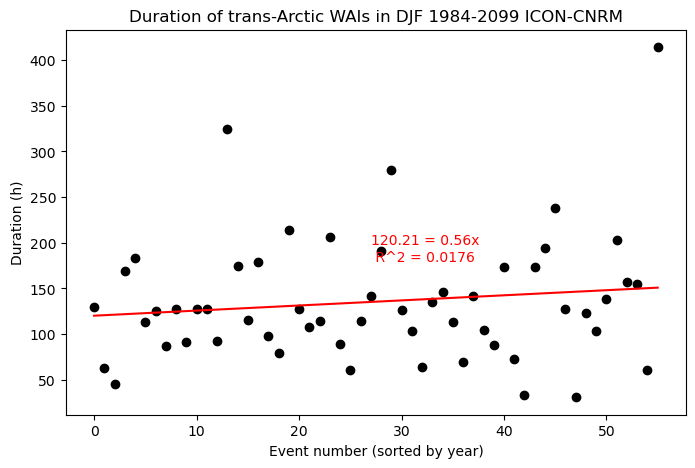

In [44]:
fig,ax = plt.subplots(1,1,figsize=(8,5))
plt.scatter(x=df_CNRM_all.index.values,y=df_CNRM_all['Duration (h)'],color='k')
plt.plot(intercept + slope*df_CNRM_all.index.values,'r',label='linear fit')
plt.text(27,180,f"{intercept:.2f} = {slope:.2f}x  \n R^2 = {r_value**2:.4f}",color='r')

plt.xlabel('Event number (sorted by year)')
plt.ylabel('Duration (h)')
plt.title('Duration of trans-Arctic WAIs in DJF 1984-2099 ICON-CNRM')

plt.show()

In [37]:
slope, intercept, r_value, p_value, std_err = linregress(df_CNRM_all.index.values, df_CNRM_all['Length (km)'])

print(f"Linear R²: {round(r_value**2,4)}")
print(f"y = {round(slope,2)} x + {round(intercept,2)}")

Linear R²: 0.0054
y = 15.69 x + 6927.55


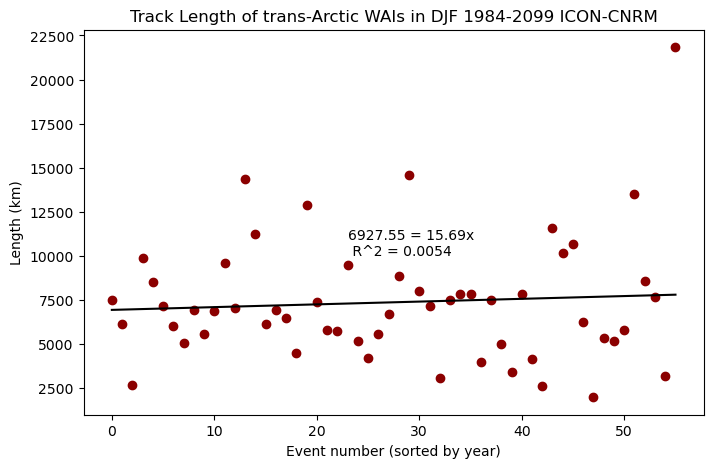

In [39]:
fig,ax = plt.subplots(1,1,figsize=(8,5))
plt.scatter(x=df_CNRM_all.index.values,y=df_CNRM_all['Length (km)'],color='darkred')
plt.plot(intercept + slope*df_CNRM_all.index.values,'k',label='linear fit')
plt.text(23,10000,f"{intercept:.2f} = {slope:.2f}x  \n R^2 = {r_value**2:.4f}",color='k')

plt.xlabel('Event number (sorted by year)')
plt.ylabel('Length (km)')
plt.title('Track Length of trans-Arctic WAIs in DJF 1984-2099 ICON-CNRM')

plt.show()

In [131]:
#Load MOAAP shapes for all event timesteps
i=3
domain = "BeaufortSiberianSea"

moaap_sel = ds_moaap.sel(time=objs_final[i].times, method='nearest')
mask = (moaap_sel.IVT_Objects == int(objs_final[i].id_.item()))

#Load variable data for the same timesteps
data_sel = data_out.T_2M.sel(time=objs_final[i].times, method='nearest')

# Align mask with data grid
aligned_mask = mask.astype(int).interp(rlat=data_sel.rlat, rlon=data_sel.rlon, method="nearest")
aligned_mask = aligned_mask > 0

# Apply the mask on the variable data
filtered_data = data_sel.where(aligned_mask)
filtered_data = filtered_data.assign_coords(lon=filtered_data.lon)# + 180) % 360) - 180)


if domain == "BeaufortSiberianSea":
        # Apply domain mask
    filtered_domain = filtered_data.where(
                    ((filtered_data.lat >= mask_domains[domain]["south"]) & (filtered_data.lat <= mask_domains[domain]["north"])) &  ((filtered_data.lon >= mask_domains[domain]["east"]) & (filtered_data.lon <= 180)) |  ((filtered_data.lat >= mask_domains[domain]["south"]) & (filtered_data.lat <= mask_domains[domain]["north"])) & ((filtered_data.lon >= -180) & (filtered_data.lon <= mask_domains[domain]["west"])))       
else: filtered_domain = filtered_data.where((filtered_data.lat>=mask_domains[domain]["south"]) & (filtered_data.lat<=mask_domains[domain]["north"]) & (filtered_data.lon>=mask_domains[domain]["west"]) & (filtered_data.lon<=mask_domains[domain]["east"]))

#Check if filtered_domain has at least min_valid_points
num_valid_points = filtered_domain.count()





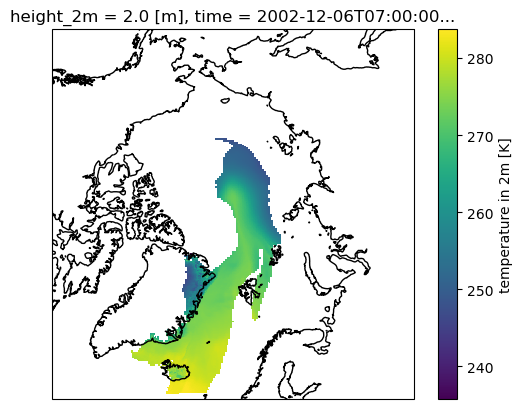

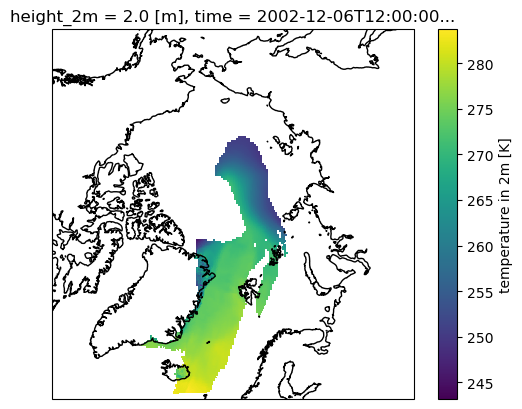

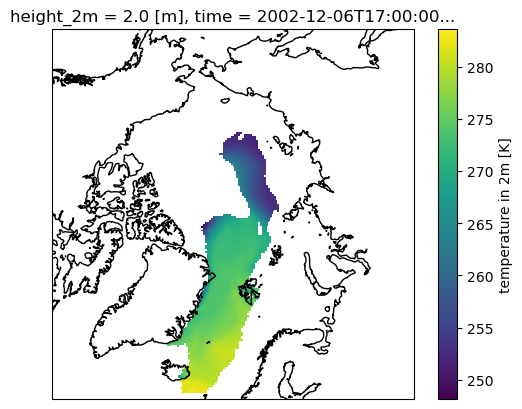

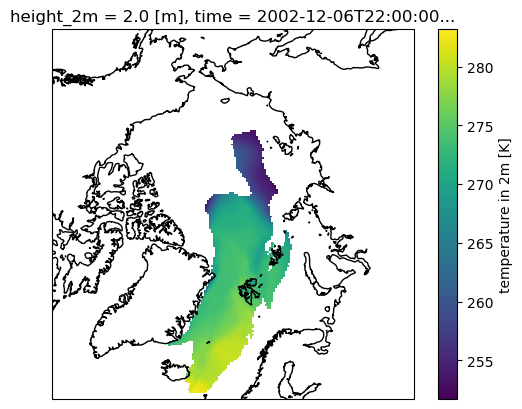

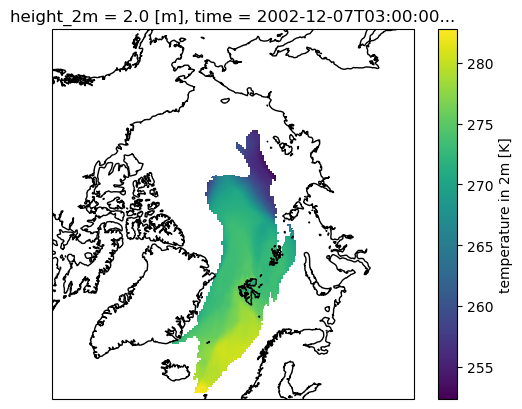

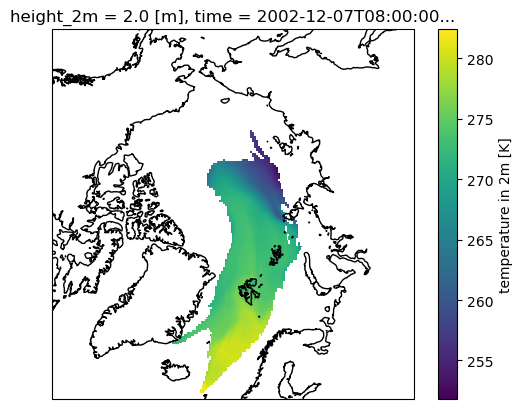

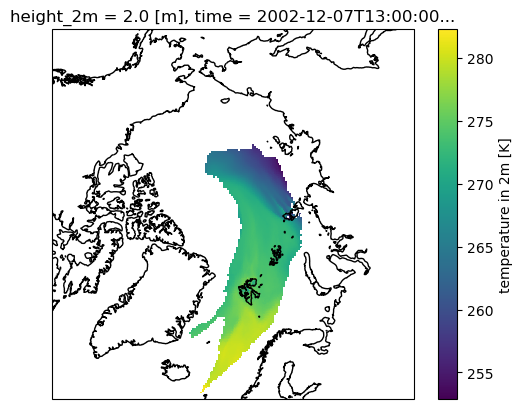

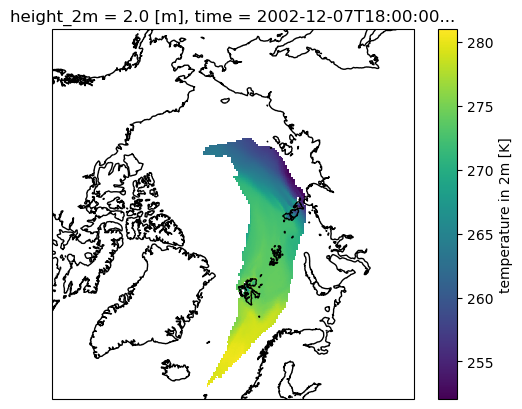

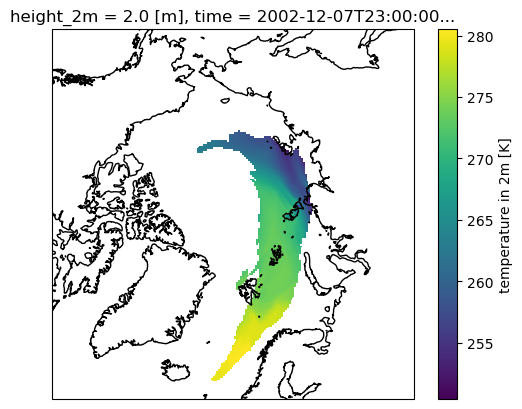

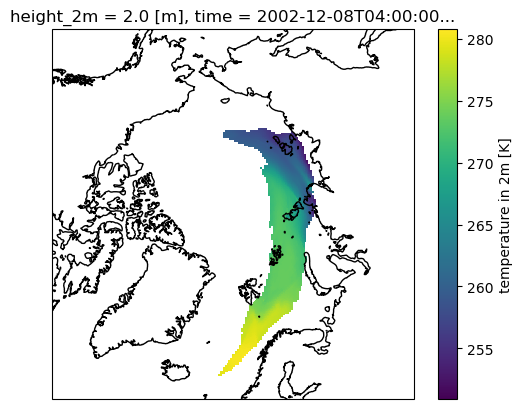

In [132]:
for i in range(40,90,5): 
    fig, ax = plt.subplots(1, 1,subplot_kw={'projection': ccrs.Orthographic(0,90)})
    filtered_data[i].plot(x='rlon',y='rlat', ax=ax, transform = crs_rot)
    #mask.plot.contour(x='rlon',y='rlat',ax=ax,levels=1,colors='k',linewidths=3,transform=crs_rot,zorder=10)
    ax.coastlines(zorder=2)

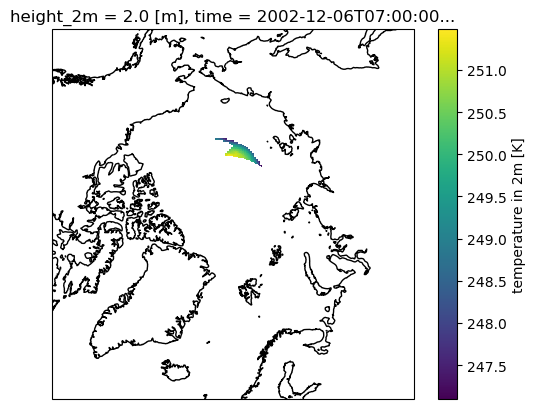

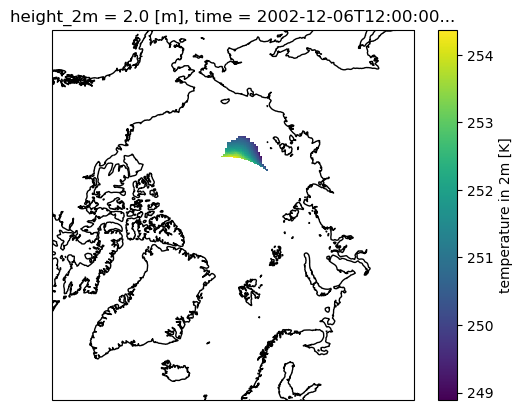

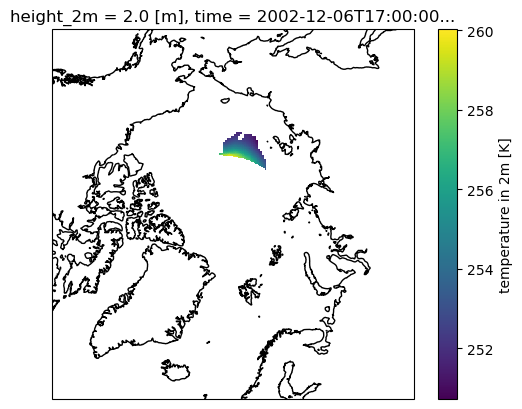

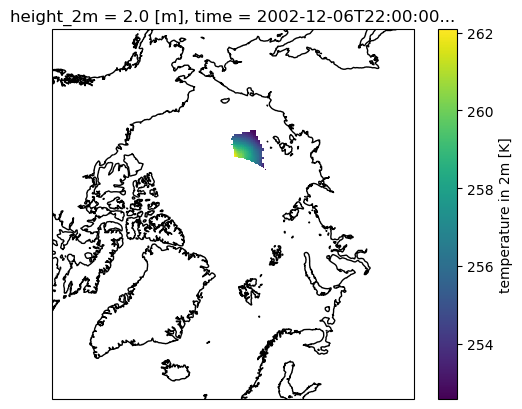

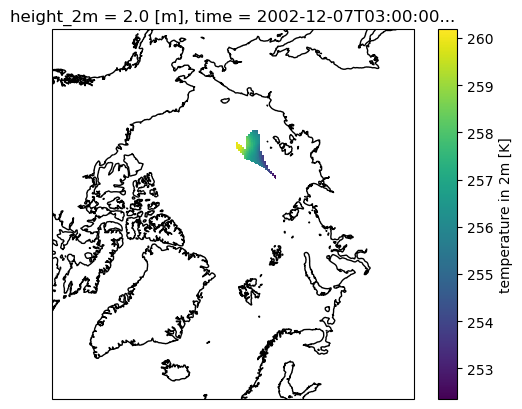

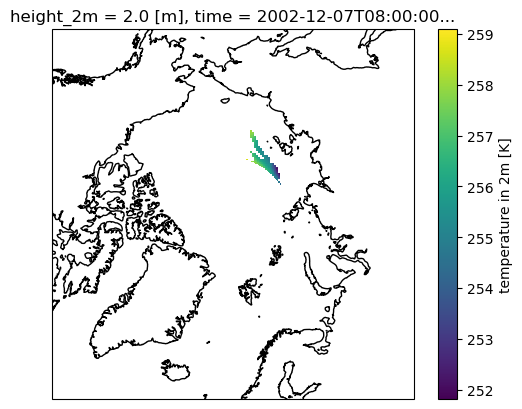

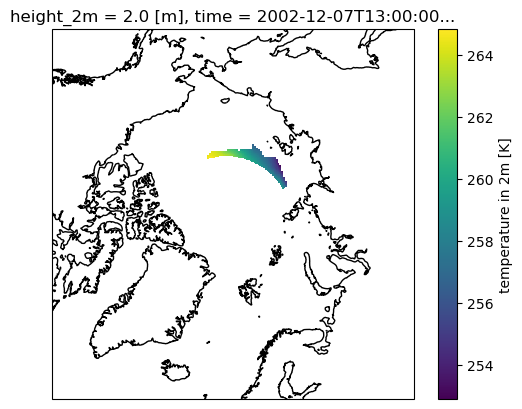

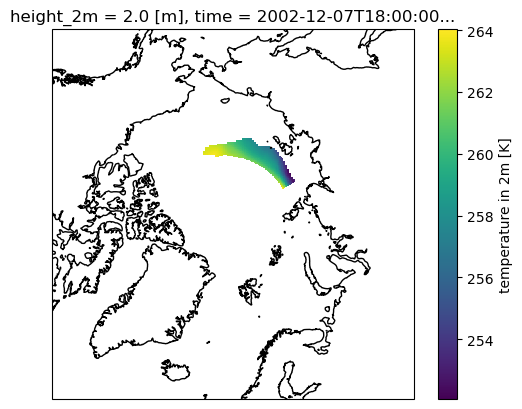

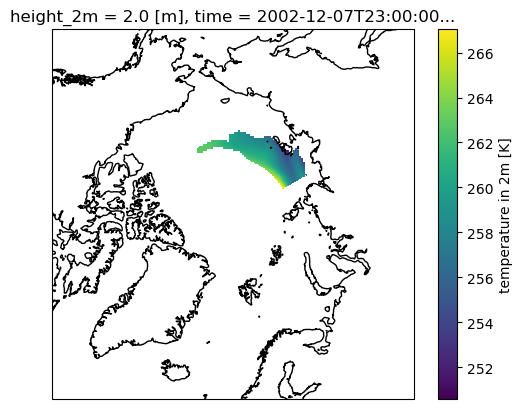

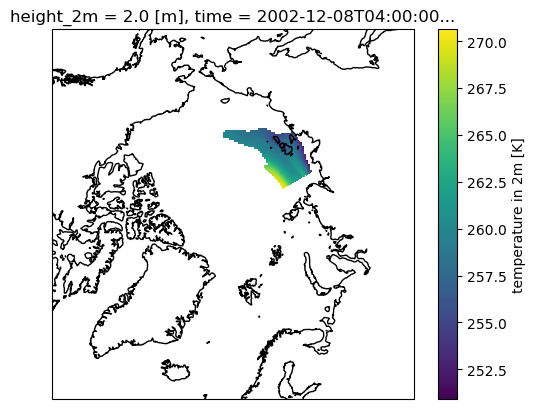

In [133]:
for i in range(40,90,5): 
    fig, ax = plt.subplots(1, 1,subplot_kw={'projection': ccrs.Orthographic(0,90)})
    filtered_domain[i].plot(x='rlon',y='rlat', ax=ax, transform = crs_rot)
    #mask.plot.contour(x='rlon',y='rlat',ax=ax,levels=1,colors='k',linewidths=3,transform=crs_rot,zorder=10)
    ax.coastlines(zorder=2)